# YOLO11l-seg Ablation Study: Method3との比較

このノートブックは、Method3（U-Net）の代わりに**YOLO11l-seg**を使用した場合の性能を評価します。

## YOLO11l-segについて
- **開発元**: Ultralytics
- **アーキテクチャ**: YOLO (You Only Look Once) セグメンテーション
- **特徴**: 軽量で高速なリアルタイムセグメンテーション
- **参考**: https://docs.ultralytics.com/

## 実験設定
- **エポック数**: 300 epochs
- **Early Stopping**: 30 epochs
- **入力解像度**: 512×512（ダウンサンプルなし）
- **モデル**: YOLO11l-seg（Large版、高精度）
- **maskratio**: 1.0（マスクダウンサンプルなし）
- **保存先**: `model/ablation_yolo11/yolo11l_fold{k}_best.pt`
- **評価指標**: Eyelid/Iris/Pupilの Dice係数, 平均 Dice

## 実行順序
1. セル1-2: GPUチェック・基本設定
2. セル3: Fold分割・データセット設定
3. セル4: 評価関数定義（crossvalidation.ipynbと同じ指標）
4. セル5: 学習関数定義
5. セル6: Resume機能（進捗管理）
6. セル7: 5-Fold CV実行（トレーニング）
7. セル8: 評価実行（crossvalidation.ipynbと同じ指標）
8. セル9: 結果集計・保存


## 1. GPUチェック・基本設定


In [1]:
import os
import json
import shutil
from pathlib import Path
from datetime import datetime
import pandas as pd
import torch

# Ultralytics YOLO
from ultralytics import YOLO

# GPU確認
if torch.cuda.is_available():
    device = torch.device('cuda')
    print(f"✓ GPUが利用可能")
    print(f"  - GPU: {torch.cuda.get_device_name(0)}")
    print(f"  - CUDA: {torch.version.cuda}")
    print(f"  - PyTorch: {torch.__version__}")
else:
    raise SystemError("GPUが利用できません。CUDA対応GPU/ドライバ/PyTorch(GPU版)を確認してください。")

# ===== パス設定 =====
IMAGES_DIR = Path("Images/images")

# YOLOラベルファイルの参照先
# 【重要】YOLOは画像パスから自動的にラベルパスを推測します
# 画像が Images/images/xxx.jpg の場合、ラベルは Images/labels/xxx.txt を探します
# prepare_yolo11_dataset.ipynb で Images/labels/ にラベルファイルを生成済みです
YOLO_LABELS_DIR = Path("Images/labels")

# モデル保存先
MODEL_DIR = Path("model/ablation_yolo11")
MODEL_DIR.mkdir(parents=True, exist_ok=True)

# YOLO設定ファイル（yaml/txt）の出力先
# データセット設定ファイル（dataset_yolo11_fold*.yaml）やFold分割リスト（yolo11_train_fold*.txt等）
# は Ablation_YOLO フォルダにまとめて保存・管理します
ABLATION_YOLO_DIR = Path("Ablation_YOLO")
ABLATION_YOLO_DIR.mkdir(parents=True, exist_ok=True)

# ===== 依存変数の自己回復（セル実行順が前後しても動くように） =====
# 途中のセルだけを実行したときに、fold_indices/image_paths/MODEL_DIR 参照が切れないようにする

def ensure_ablation_context():
    """fold_indices / image_paths / MODEL_DIR など、後段セルが参照する変数を必要に応じて復元する"""
    global IMAGES_DIR, MODEL_DIR, fold_indices, image_paths

    # パス（未定義なら定義）
    if 'IMAGES_DIR' not in globals():
        IMAGES_DIR = Path("Images/images")
    if 'MODEL_DIR' not in globals():
        MODEL_DIR = Path("model/ablation_yolo11")
        MODEL_DIR.mkdir(parents=True, exist_ok=True)

    # fold_indices（未ロードならロード）
    if 'fold_indices' not in globals():
        with open('fold_indices.json', 'r') as f:
            fold_indices = json.load(f)

    # image_paths（未生成なら生成）
    if 'image_paths' not in globals():
        df = pd.read_csv('image_metadata.csv')
        image_paths = [IMAGES_DIR / row['filename'] for _, row in df.iterrows()]

# 以降のセルを単独実行する場合は、最初に ensure_ablation_context() を呼ぶと安全です

# ハイパーパラメータ
IMAGE_SIZE = 512  # 512×512（ダウンサンプルなし）
BATCH_SIZE = 16
NUM_EPOCHS = 300
EARLY_STOP_PATIENCE = 30
NUM_FOLDS = 5
NUM_CLASSES = 6  # 6クラス（background含む）

# YOLO設定
YOLO_MODEL_NAME = "yolo11l-seg.pt"  # Large版（高精度）
MASK_RATIO = 1  # マスクダウンサンプルなし

print(f"\n✓ セットアップ完了")
print(f"  - モデル保存先: {MODEL_DIR}")
print(f"  - YOLOモデル: {YOLO_MODEL_NAME}")
print(f"  - 画像サイズ: {IMAGE_SIZE}×{IMAGE_SIZE}")
print(f"  - maskratio: {MASK_RATIO}（ダウンサンプルなし）")
print(f"  - エポック数: {NUM_EPOCHS}, Early Stopping: {EARLY_STOP_PATIENCE}")
print(f"  - バッチサイズ: {BATCH_SIZE}, Fold数: {NUM_FOLDS}")


✓ GPUが利用可能
  - GPU: NVIDIA GeForce RTX 3080 Ti Laptop GPU
  - CUDA: 12.4
  - PyTorch: 2.6.0+cu124

✓ セットアップ完了
  - モデル保存先: model\ablation_yolo11
  - YOLOモデル: yolo11l-seg.pt
  - 画像サイズ: 512×512
  - maskratio: 1（ダウンサンプルなし）
  - エポック数: 300, Early Stopping: 30
  - バッチサイズ: 16, Fold数: 5


## 2. Fold分割・データセット設定


In [13]:
# fold indices読み込み
with open('fold_indices.json', 'r') as f:
    fold_indices = json.load(f)

# 画像リスト
df = pd.read_csv('image_metadata.csv')
image_paths = [IMAGES_DIR / row['filename'] for _, row in df.iterrows()]

def create_yolo_dataset_yaml(fold_idx, train_indices, val_indices, output_dir="Ablation_YOLO"):
    """
    YOLO用のデータセット設定ファイル（yaml）を作成
    
    【出力先】Ablation_YOLO フォルダ
    - dataset_yolo11_fold{fold_idx}.yaml: データセット設定ファイル
    - yolo11_train_fold{fold_idx}.txt: 訓練データ画像パスリスト
    - yolo11_val_fold{fold_idx}.txt: 検証データ画像パスリスト
    
    Args:
        fold_idx: Fold番号
        train_indices: 訓練データのインデックスリスト
        val_indices: 検証データのインデックスリスト
        output_dir: 出力ディレクトリ（デフォルト: "Ablation_YOLO"）
    """
    # 訓練/検証データの画像パスリストファイルを作成（Ablation_YOLOフォルダに保存）
    train_list_file = Path(output_dir) / f"yolo11_train_fold{fold_idx}.txt"
    val_list_file = Path(output_dir) / f"yolo11_val_fold{fold_idx}.txt"
    
    # 画像パスを相対パスで書き込み
    with open(train_list_file, 'w') as f:
        for idx in train_indices:
            img_path = image_paths[idx]
            f.write(f"{img_path}\n")
    
    with open(val_list_file, 'w') as f:
        for idx in val_indices:
            img_path = image_paths[idx]
            f.write(f"{img_path}\n")
    
    # YOLO用yamlファイルを作成（Ablation_YOLOフォルダに保存）
    yaml_content = f"""# YOLO11データセット設定 (Fold {fold_idx})
path: {Path(output_dir).absolute()}
train: {train_list_file.absolute()}
val: {val_list_file.absolute()}

# クラス名
names:
  0: background
  1: conj
  2: iris_vis
  3: iris_occ
  4: pupil_vis
  5: pupil_occ

# クラス数
nc: {NUM_CLASSES}
"""
    
    # Ablation_YOLOフォルダにyamlファイルを保存
    yaml_file = Path(output_dir) / f"dataset_yolo11_fold{fold_idx}.yaml"
    with open(yaml_file, 'w', encoding='utf-8') as f:
        f.write(yaml_content)
    
    return yaml_file

print("✓ Fold分割・データセット設定関数を定義しました")


✓ Fold分割・データセット設定関数を定義しました


## 4. 評価関数定義（crossvalidation.ipynbと同じ指標）

YOLOのマスクは0-1のfloatのため修正

In [24]:
import cv2
import numpy as np
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
from PIL import Image
from skimage.measure import EllipseModel, ransac  # 楕円フィッティング用

# ===== 評価用データセット定義（crossvalidation.ipynbと同じ構造） =====
LABEL_SEG_DIR = Path("Images/labels_seg")
LABEL_OBB_DIR = Path("Images/labels_obb")

class EyeSegmentationDataset(Dataset):
    """評価用データセット（crossvalidation.ipynbと同じ構造）"""
    def __init__(self, image_paths, label_seg_dir, label_obb_dir, transform=False):
        self.image_paths = image_paths
        self.label_seg_dir = label_seg_dir
        self.label_obb_dir = label_obb_dir
        self.transform = transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        stem = Path(img_path).stem
        
        # 画像読み込み
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (512, 512))
        img = img.astype(np.float32) / 255.0
        img = torch.from_numpy(img).permute(2, 0, 1)  # (H, W, C) -> (C, H, W)
        
        # Ground Truthマスク読み込み
        lid_mask = cv2.imread(str(self.label_seg_dir / f"{stem}_mask_lid.png"), 0)
        iris_mask = cv2.imread(str(self.label_obb_dir / f"{stem}_mask_iris.png"), 0)
        pupil_mask = cv2.imread(str(self.label_obb_dir / f"{stem}_mask_pupil.png"), 0)
        
        # リサイズ（念のため）
        if lid_mask is not None:
            lid_mask = cv2.resize(lid_mask, (512, 512), interpolation=cv2.INTER_NEAREST)
        else:
            lid_mask = np.zeros((512, 512), dtype=np.uint8)
        
        if iris_mask is not None:
            iris_mask = cv2.resize(iris_mask, (512, 512), interpolation=cv2.INTER_NEAREST)
        else:
            iris_mask = np.zeros((512, 512), dtype=np.uint8)
        
        if pupil_mask is not None:
            pupil_mask = cv2.resize(pupil_mask, (512, 512), interpolation=cv2.INTER_NEAREST)
        else:
            pupil_mask = np.zeros((512, 512), dtype=np.uint8)
        
        return {
            'image': img,
            'mask_lid': torch.from_numpy(lid_mask),
            'mask_iris': torch.from_numpy(iris_mask),
            'mask_pupil': torch.from_numpy(pupil_mask),
            'filename': stem
        }

# ===== Dice係数計算関数（crossvalidation.ipynbと同じ） =====
def dice_binary_np(pred_bin_255: np.ndarray, gt_bin_255: np.ndarray, smooth=1e-6):
    """Numpy配列でDice係数を計算（crossvalidation.ipynbと同じ実装）"""
    p = (pred_bin_255 > 0).astype(np.uint8)
    g = (gt_bin_255 > 0).astype(np.uint8)
    inter = (p & g).sum()
    union = p.sum() + g.sum()
    return (2 * inter + smooth) / (union + smooth)

# ===== 楕円フィッティング関数（crossvalidation.ipynbから移植） =====
def mask_to_edge(mask_bin: np.ndarray, thickness: int = 3) -> np.ndarray:
    """0/255マスク → 外輪郭(最大輪郭のみ)のエッジ(0/255)

    本法（OuterArc）の外輪郭抽出と整合させるため、RETR_EXTERNALで得た輪郭のうち
    面積最大の1つだけを採用します。
    """
    m = (mask_bin > 0).astype(np.uint8)
    contours, _ = cv2.findContours(m, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    edge = np.zeros_like(mask_bin, dtype=np.uint8)
    if not contours:
        return edge
    cnt = max(contours, key=cv2.contourArea)
    cv2.drawContours(edge, [cnt], -1, 255, thickness=thickness)
    return edge

def fit_ellipse_ransac(edge_points, min_samples=5, residual_threshold=2.0, max_trials=100):
    """
    RANSAC + 最小二乗法による楕円フィッティング
    部分的なエッジ（90度未満）に対してロバスト

    Args:
        edge_points: (N, 2) array of (y, x) coordinates
        min_samples: RANSACの最小サンプル数（楕円は5点必要）
        residual_threshold: インライア判定の閾値（ピクセル単位）
        max_trials: RANSAC試行回数

    Returns:
        cv2.ellipse形式のタプル: ((cx, cy), (width, height), angle_deg)
        失敗時: None
    """
    if len(edge_points) < 5:
        return None

    # (y, x) -> (x, y) に変換（skimageは(x,y)形式）
    points = edge_points[:, ::-1].astype(np.float64)

    try:
        # RANSACで楕円をフィット
        model, inliers = ransac(
            points,
            EllipseModel,
            min_samples=min_samples,
            residual_threshold=residual_threshold,
            max_trials=max_trials
        )

        # インライア点のみで再フィッティング（より精密）
        if inliers is not None and np.sum(inliers) >= 5:
            final_model = EllipseModel()
            final_model.estimate(points[inliers])

            # パラメータ抽出: (xc, yc, a, b, theta)
            xc, yc, a, b, theta = final_model.params

            # cv2.ellipse形式に変換: ((xc, yc), (2*a, 2*b), theta_deg)
            return ((float(xc), float(yc)), (float(2*a), float(2*b)), float(np.degrees(theta)))

    except Exception:
        # RANSACが失敗した場合（データが少なすぎる等）
        pass

    return None

def binary_to_ellipse_mask(mask_bin: np.ndarray, residual_threshold=2.0) -> np.ndarray:
    """
    マスク(0/255)からRANSAC+最小二乗法で楕円フィッティング → 楕円マスクを返す（whole-mask RANSAC）

    ※外輪郭は "最大輪郭のみ"（mask_to_edge）に統一。
    """
    H, W = mask_bin.shape

    # エッジ抽出（thickness=3）
    edge_mask = mask_to_edge(mask_bin, thickness=3)

    # エッジ座標を取得
    edge_points = np.column_stack(np.where(edge_mask > 0))  # (N, 2) in (y, x)

    if len(edge_points) < 5:
        return np.zeros_like(mask_bin)

    ellipse = fit_ellipse_ransac(edge_points, residual_threshold=residual_threshold)
    if ellipse is None:
        return np.zeros_like(mask_bin)

    ellipse_mask = np.zeros((H, W), dtype=np.uint8)
    center = (int(ellipse[0][0]), int(ellipse[0][1]))
    axes = (max(1, int(ellipse[1][0]/2)), max(1, int(ellipse[1][1]/2)))
    angle = ellipse[2]
    cv2.ellipse(ellipse_mask, center, axes, angle, 0, 360, 255, thickness=-1)

    return ellipse_mask


def ransac_ellipse_mask_from_visible_outer_arc(vis_255: np.ndarray, occ_255: np.ndarray,
                                              boundary_width: int = 7,
                                              vis_near_radius: int = 2,
                                              outer_thickness: int = 2,
                                              residual_threshold: float = 2.0):
    """露出弧（outerarc）の点群に限定してRANSACで楕円化する（露出弧限定RANSAC）。

    Returns:
        ellipse_mask (0/255)
    """
    mask, _params, _edge_outer, edge_arc, _boundary = ellipse_mask_from_visible_outer_arc(
        vis_255, occ_255,
        boundary_width=boundary_width,
        vis_near_radius=vis_near_radius,
        outer_thickness=outer_thickness,
    )
    # edge_arcから点群を作ってRANSAC
    pts_yx = np.column_stack(np.where(edge_arc > 0))
    if len(pts_yx) < 5:
        return np.zeros_like(vis_255)

    ellipse = fit_ellipse_ransac(pts_yx, residual_threshold=residual_threshold)
    if ellipse is None:
        return np.zeros_like(vis_255)

    H, W = vis_255.shape
    ellipse_mask = np.zeros((H, W), dtype=np.uint8)
    center = (int(ellipse[0][0]), int(ellipse[0][1]))
    axes = (max(1, int(ellipse[1][0]/2)), max(1, int(ellipse[1][1]/2)))
    angle = ellipse[2]
    cv2.ellipse(ellipse_mask, center, axes, angle, 0, 360, 255, thickness=-1)
    return ellipse_mask

# ===== 外輪郭→露出弧 から楕円化（本法） =====
# RANSACとは別に「iris_full(=vis+occ)の外輪郭だけ」を使って、まぶた切断境界を混ぜない楕円を作る

def _outer_contour_edge_255(mask_255: np.ndarray, thickness: int = 2) -> np.ndarray:
    """0/255マスクから外輪郭(RETR_EXTERNAL)のみをエッジ(0/255)で返す（穴=瞳孔は無視）"""
    m = (mask_255 > 0).astype(np.uint8)
    cnts, _ = cv2.findContours(m, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    edge = np.zeros_like(mask_255, dtype=np.uint8)
    if not cnts:
        return edge
    cnt = max(cnts, key=cv2.contourArea)
    cv2.drawContours(edge, [cnt], -1, 255, thickness=thickness)
    return edge


def _ellipse_params_norm_from_cv2(ellipse, H: int, W: int) -> np.ndarray:
    """cv2.fitEllipseの戻り値 → crossvalidation.ipynbと同じ5要素正規化 [cx,cy,w,h,angle]"""
    (cx, cy), (w, h), angle = ellipse
    cx_norm = np.clip(cx / W, 0, 1)
    cy_norm = np.clip(cy / H, 0, 1)
    w_norm = np.clip(w / W, 1e-6, 1.0)
    h_norm = np.clip(h / H, 1e-6, 1.0)
    angle_norm = (angle % 180) / 180.0
    return np.array([cx_norm, cy_norm, w_norm, h_norm, angle_norm], dtype=np.float32)


def ellipse_mask_from_visible_outer_arc(vis_255: np.ndarray, occ_255: np.ndarray,
                                       boundary_width: int = 7,
                                       vis_near_radius: int = 2,
                                       outer_thickness: int = 2):
    """(vis,occ)から「外輪郭→露出弧」を抽出し、cv2.fitEllipseで楕円化したマスクと正規化パラメータを返す"""

    H, W = vis_255.shape
    vis_255 = (vis_255 > 0).astype(np.uint8) * 255
    occ_255 = (occ_255 > 0).astype(np.uint8) * 255

    full_255 = cv2.bitwise_or(vis_255, occ_255)

    # 真の外輪郭（瞳孔境界や切断面はここに含まれない）
    edge_outer = _outer_contour_edge_255(full_255, thickness=outer_thickness)

    # 露出側の近傍に乗っている弧だけ採用
    vis_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (vis_near_radius * 2 + 1, vis_near_radius * 2 + 1))
    vis_near = cv2.dilate(vis_255, vis_kernel)
    edge_arc = cv2.bitwise_and(edge_outer, vis_near)

    # 参考: 露出×(隠れ膨張)の境界近傍（デバッグ時に使う）
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (boundary_width * 2 + 1, boundary_width * 2 + 1))
    occ_dil = cv2.dilate(occ_255, kernel)
    boundary_region = cv2.bitwise_and(occ_dil, vis_255)

    pts_yx = np.column_stack(np.where(edge_arc > 0))
    if len(pts_yx) < 5:
        return np.zeros((H, W), dtype=np.uint8), None, edge_outer, edge_arc, boundary_region

    try:
        pts_xy = pts_yx[:, ::-1].astype(np.float32)
        ellipse = cv2.fitEllipse(pts_xy)
        params = _ellipse_params_norm_from_cv2(ellipse, H, W)

        ellipse_mask = np.zeros((H, W), dtype=np.uint8)
        (cx, cy), (w, h), angle = ellipse
        center = (int(cx), int(cy))
        axes = (max(1, int(w / 2)), max(1, int(h / 2)))
        cv2.ellipse(ellipse_mask, center, axes, float(angle), 0, 360, 255, thickness=-1)
        return ellipse_mask, params, edge_outer, edge_arc, boundary_region
    except Exception:
        return np.zeros((H, W), dtype=np.uint8), None, edge_outer, edge_arc, boundary_region


def ellipse_mask_from_full_max_contour(vis_255: np.ndarray, occ_255: np.ndarray):
    """(vis,occ)をORして得たfullマスクから、最大外輪郭のみを使ってcv2.fitEllipseで楕円化する（RANSACなし）。

    - full = vis OR occ
    - fullの外輪郭(RETR_EXTERNAL)のうち最大輪郭だけ採用（RANSACの輪郭抽出と整合）
    - その輪郭点群に対して cv2.fitEllipse

    Returns:
        ellipse_mask (0/255), params_norm(5,) or None
    """
    H, W = vis_255.shape
    vis_255 = (vis_255 > 0).astype(np.uint8) * 255
    occ_255 = (occ_255 > 0).astype(np.uint8) * 255
    full_255 = cv2.bitwise_or(vis_255, occ_255)

    m = (full_255 > 0).astype(np.uint8)
    cnts, _ = cv2.findContours(m, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    if not cnts:
        return np.zeros((H, W), dtype=np.uint8), None

    cnt = max(cnts, key=cv2.contourArea)
    pts = cnt.reshape(-1, 2).astype(np.float32)
    if len(pts) < 5:
        return np.zeros((H, W), dtype=np.uint8), None

    try:
        ellipse = cv2.fitEllipse(pts)
        params = _ellipse_params_norm_from_cv2(ellipse, H, W)

        ellipse_mask = np.zeros((H, W), dtype=np.uint8)
        (cx, cy), (w, h), angle = ellipse
        center = (int(cx), int(cy))
        axes = (max(1, int(w / 2)), max(1, int(h / 2)))
        cv2.ellipse(ellipse_mask, center, axes, float(angle), 0, 360, 255, thickness=-1)
        return ellipse_mask, params
    except Exception:
        return np.zeros((H, W), dtype=np.uint8), None


# ===== 評価関数（RANSAC/本法の楕円化対応版） =====
def evaluate_yolo(model, val_loader, device, use_ellipse_fitting=False, use_outerarc_fitting=False, use_fullmax_fitting=False):
    """
    YOLO11l-segモデルを評価（crossvalidation.ipynbのevaluate_method3と同じ指標）

    【評価指標】
    - Eyelid: クラス1,2,4の和（conj + iris_vis + pupil_vis）
    - Iris: クラス2,3の和（iris_vis + iris_occ）
    - Pupil: クラス4,5の和（pupil_vis + pupil_occ）

    Args:
        model: YOLOモデル
        val_loader: 検証データローダー
        device: デバイス
        use_ellipse_fitting: (RANSAC) Iris/Pupilに楕円フィッティングを適用するか
        use_outerarc_fitting: (本法1) 露出弧fit（外輪郭→露出弧）で楕円化を適用するか（最優先）
        use_fullmax_fitting: (本法2) fullマスク最大外輪郭fit（RANSACなし）で楕円化を適用するか（outerarcの次に優先）

    Returns:
        dict: {'eyelid': float, 'iris': float, 'pupil': float, 'mean': float,
               'iris_before_ellipse': float, 'pupil_before_ellipse': float}
    """
    model.eval()
    lid_scores = []
    iris_scores = []
    pupil_scores = []
    iris_scores_before = []  # 楕円フィッティング前のスコア
    pupil_scores_before = []  # 楕円フィッティング前のスコア
    
    if use_outerarc_fitting:
        desc = "YOLO評価（本法1: 露出弧fit）"
    elif use_fullmax_fitting:
        desc = "YOLO評価（本法2: full最大外輪郭fit）"
    else:
        desc = f"YOLO評価({'楕円フィッティングあり' if use_ellipse_fitting else '楕円フィッティングなし'})"
    
    with torch.no_grad():
        for batch in tqdm(val_loader, desc=desc):
            images = batch['image']  # (B, C, H, W)
            filenames = batch['filename']
            gt_lid = batch['mask_lid'].cpu().numpy()
            gt_iris = batch['mask_iris'].cpu().numpy()
            gt_pupil = batch['mask_pupil'].cpu().numpy()
            
            # YOLO推論（画像ファイルから直接読み込む - val_batchと同じ方法）
            # バッチを1枚ずつ処理
            for b in range(images.shape[0]):
                filename = filenames[b]
                
                # 画像ファイルから直接読み込んで推論（val_batchと同じ方法）
                # filenameはstem（拡張子なし）なので、.jpgを追加
                img_path = Path("Images/images") / f"{filename}.jpg"
                
                # YOLO推論（画像パスから直接推論）
                results = model.predict(str(img_path), verbose=False, imgsz=512)
                
                if len(results) == 0:
                    # 推論結果がない場合、空のマスク
                    seg_mask = np.zeros((512, 512), dtype=np.uint8)
                else:
                    result = results[0]
                    
                    # 6クラスセグメンテーションマスクを構築
                    h, w = 512, 512
                    seg_mask = np.zeros((h, w), dtype=np.uint8)  # クラスIDを格納
                    
                    if result.masks is not None and len(result.masks.data) > 0:
                        masks = result.masks.data.cpu().numpy()  # (N, H, W)
                        classes = result.boxes.cls.cpu().numpy().astype(int)  # (N,)
                        
                        # クラスごとにマスクを結合してからseg_maskに設定
                        # 同じクラスの複数インスタンスはOR演算で結合
                        class_masks = {}  # {cls_id: combined_mask}
                        for mask, cls_id in zip(masks, classes):
                            # マスクを512x512にリサイズ（必要に応じて）
                            if mask.shape != (h, w):
                                mask_resized = cv2.resize(mask.astype(np.float32), (w, h), interpolation=cv2.INTER_LINEAR)
                            else:
                                mask_resized = mask.astype(np.float32)
                            
                            # マスクをバイナリ化（閾値0.5）
                            mask_binary = (mask_resized > 0.5).astype(np.uint8)
                            
                            # 同じクラスの複数インスタンスをOR演算で結合
                            if cls_id not in class_masks:
                                class_masks[cls_id] = mask_binary
                            else:
                                class_masks[cls_id] = np.maximum(class_masks[cls_id], mask_binary)
                        
                        # クラスごとにseg_maskを更新（優先順位: pupil > iris > conj）
                        # クラスIDの大きい順（5,4,3,2,1）で処理すると、後から来るクラスで上書きされる
                        for cls_id in sorted(class_masks.keys(), reverse=True):
                            seg_mask[class_masks[cls_id] > 0] = cls_id
                
                # Eyelid: クラス1,2,4の和（conj + iris_vis + pupil_vis）
                lid_pred = (((seg_mask == 1) | (seg_mask == 2) | (seg_mask == 4)).astype(np.uint8) * 255)
                lid_scores.append(dice_binary_np(lid_pred, gt_lid[b]))
                
                # Iris/Pupil（raw）
                iris_pred_raw = (((seg_mask == 2) | (seg_mask == 3)).astype(np.uint8) * 255)
                pupil_pred_raw = (((seg_mask == 4) | (seg_mask == 5)).astype(np.uint8) * 255)

                # vis/occ（本法で使用）
                iris_vis_pred = ((seg_mask == 2).astype(np.uint8) * 255)
                iris_occ_pred = ((seg_mask == 3).astype(np.uint8) * 255)
                pupil_vis_pred = ((seg_mask == 4).astype(np.uint8) * 255)
                pupil_occ_pred = ((seg_mask == 5).astype(np.uint8) * 255)

                # 楕円化前（raw）のスコア
                iris_scores_before.append(dice_binary_np(iris_pred_raw, gt_iris[b]))
                pupil_scores_before.append(dice_binary_np(pupil_pred_raw, gt_pupil[b]))

                # 楕円化（優先順位: 本法1(露出弧) → 本法2(full最大輪郭) → RANSAC → なし）
                if use_outerarc_fitting:
                    iris_pred, _, _, _, _ = ellipse_mask_from_visible_outer_arc(
                        iris_vis_pred, iris_occ_pred,
                        boundary_width=7, vis_near_radius=2, outer_thickness=2
                    )
                    pupil_pred, _, _, _, _ = ellipse_mask_from_visible_outer_arc(
                        pupil_vis_pred, pupil_occ_pred,
                        boundary_width=3, vis_near_radius=1, outer_thickness=2
                    )
                elif use_fullmax_fitting:
                    iris_pred, _ = ellipse_mask_from_full_max_contour(iris_vis_pred, iris_occ_pred)
                    pupil_pred, _ = ellipse_mask_from_full_max_contour(pupil_vis_pred, pupil_occ_pred)
                elif use_ellipse_fitting:
                    iris_pred = binary_to_ellipse_mask(iris_pred_raw)
                    pupil_pred = binary_to_ellipse_mask(pupil_pred_raw)
                else:
                    iris_pred = iris_pred_raw
                    pupil_pred = pupil_pred_raw

                iris_scores.append(dice_binary_np(iris_pred, gt_iris[b]))
                pupil_scores.append(dice_binary_np(pupil_pred, gt_pupil[b]))
    
    result = {
        'eyelid': np.mean(lid_scores),
        'iris': np.mean(iris_scores),
        'pupil': np.mean(pupil_scores),
        'mean': np.mean([np.mean(lid_scores), np.mean(iris_scores), np.mean(pupil_scores)]),
        'iris_before_ellipse': np.mean(iris_scores_before),
        'pupil_before_ellipse': np.mean(pupil_scores_before)
    }

    return result

print("✓ 評価関数を定義しました（楕円フィッティング対応版）")

# ===== 必要な手法だけ評価（RANSACは必要なときだけ実行） =====
def evaluate_yolo_all_modes(model, val_loader, device, modes=None):
    """同一の推論結果(seg_mask)から、指定した手法だけDiceを計算（RANSACは必要な場合のみ）。

    - out: 各手法の平均Dice（画像単位の平均）
    - per_image: 画像ごとのDice（filename/subject_id付き）

    Args:
        modes: None or iterable of method names.
               有効: {'raw','outerarc','fullmax','ransac_whole','ransac_arc'}
               None の場合は全手法。

    Returns:
        (out, per_image)
        out: dict[mode] -> {'eyelid','iris','pupil','mean'}
        per_image: dict[mode] -> list[{'filename','subject_id','eyelid','iris','pupil','mean'}]
    """
    model.eval()

    all_modes = ['raw', 'outerarc', 'fullmax', 'ransac_whole', 'ransac_arc']
    if modes is None:
        modes = set(all_modes)
    else:
        modes = set(modes)

    scores = {k: {'lid': [], 'iris': [], 'pupil': [], 'mean': []} for k in all_modes}
    per_image = {k: [] for k in all_modes}

    with torch.no_grad():
        desc = 'YOLO評価（modes=' + ','.join([m for m in all_modes if m in modes]) + ')'
        for batch in tqdm(val_loader, desc=desc):
            images = batch['image']
            filenames = batch['filename']
            gt_lid = batch['mask_lid'].cpu().numpy()
            gt_iris = batch['mask_iris'].cpu().numpy()
            gt_pupil = batch['mask_pupil'].cpu().numpy()

            for b in range(images.shape[0]):
                filename = filenames[b]
                subject_id = str(filename).split('-', 1)[0]
                img_path = Path("Images/images") / f"{filename}.jpg"
                results = model.predict(str(img_path), verbose=False, imgsz=512)

                h, w = 512, 512
                seg_mask = np.zeros((h, w), dtype=np.uint8)
                if len(results) > 0:
                    r0 = results[0]
                    if r0.masks is not None and len(r0.masks.data) > 0:
                        masks = r0.masks.data.cpu().numpy()
                        classes = r0.boxes.cls.cpu().numpy().astype(int)
                        class_masks = {}
                        for mask, cls_id in zip(masks, classes):
                            if mask.shape != (h, w):
                                m = cv2.resize(mask.astype(np.float32), (w, h), interpolation=cv2.INTER_LINEAR)
                            else:
                                m = mask.astype(np.float32)
                            mb = (m > 0.5).astype(np.uint8)
                            class_masks[cls_id] = mb if cls_id not in class_masks else np.maximum(class_masks[cls_id], mb)
                        for cls_id in sorted(class_masks.keys(), reverse=True):
                            seg_mask[class_masks[cls_id] > 0] = cls_id

                # 共通: eyelid
                lid_pred = (((seg_mask == 1) | (seg_mask == 2) | (seg_mask == 4)).astype(np.uint8) * 255)
                lid_d = float(dice_binary_np(lid_pred, gt_lid[b]))

                # raw（他手法の入力にもなるので常に作る）
                iris_raw = (((seg_mask == 2) | (seg_mask == 3)).astype(np.uint8) * 255)
                pupil_raw = (((seg_mask == 4) | (seg_mask == 5)).astype(np.uint8) * 255)

                # vis/occ（outerarc/fullmax/ransac_arcの入力）
                iris_vis = ((seg_mask == 2).astype(np.uint8) * 255)
                iris_occ = ((seg_mask == 3).astype(np.uint8) * 255)
                pupil_vis = ((seg_mask == 4).astype(np.uint8) * 255)
                pupil_occ = ((seg_mask == 5).astype(np.uint8) * 255)

                def add(mode, iris_mask, pupil_mask):
                    i = float(dice_binary_np(iris_mask, gt_iris[b]))
                    p = float(dice_binary_np(pupil_mask, gt_pupil[b]))
                    m = float(np.mean([lid_d, i, p]))
                    scores[mode]['lid'].append(lid_d)
                    scores[mode]['iris'].append(i)
                    scores[mode]['pupil'].append(p)
                    scores[mode]['mean'].append(m)
                    per_image[mode].append({
                        'filename': str(filename),
                        'subject_id': str(subject_id),
                        'eyelid': lid_d,
                        'iris': i,
                        'pupil': p,
                        'mean': m,
                    })

                if 'raw' in modes:
                    add('raw', iris_raw, pupil_raw)

                if 'outerarc' in modes:
                    iris_outer, _p, *_ = ellipse_mask_from_visible_outer_arc(iris_vis, iris_occ, boundary_width=7, vis_near_radius=2, outer_thickness=2)
                    pupil_outer, _p2, *_ = ellipse_mask_from_visible_outer_arc(pupil_vis, pupil_occ, boundary_width=3, vis_near_radius=1, outer_thickness=2)
                    add('outerarc', iris_outer, pupil_outer)

                if 'fullmax' in modes:
                    iris_fullmax, _ = ellipse_mask_from_full_max_contour(iris_vis, iris_occ)
                    pupil_fullmax, _ = ellipse_mask_from_full_max_contour(pupil_vis, pupil_occ)
                    add('fullmax', iris_fullmax, pupil_fullmax)

                # ここからRANSAC（必要な場合のみ）
                if 'ransac_whole' in modes:
                    iris_ransac_whole = binary_to_ellipse_mask(iris_raw)
                    pupil_ransac_whole = binary_to_ellipse_mask(pupil_raw)
                    add('ransac_whole', iris_ransac_whole, pupil_ransac_whole)

                if 'ransac_arc' in modes:
                    iris_ransac_arc = ransac_ellipse_mask_from_visible_outer_arc(iris_vis, iris_occ, boundary_width=7, vis_near_radius=2, outer_thickness=2)
                    pupil_ransac_arc = ransac_ellipse_mask_from_visible_outer_arc(pupil_vis, pupil_occ, boundary_width=3, vis_near_radius=1, outer_thickness=2)
                    add('ransac_arc', iris_ransac_arc, pupil_ransac_arc)

    out = {}
    for mode in all_modes:
        out[mode] = {
            'eyelid': float(np.mean(scores[mode]['lid'])) if len(scores[mode]['lid']) else 0.0,
            'iris': float(np.mean(scores[mode]['iris'])) if len(scores[mode]['iris']) else 0.0,
            'pupil': float(np.mean(scores[mode]['pupil'])) if len(scores[mode]['pupil']) else 0.0,
            'mean': float(np.mean(scores[mode]['mean'])) if len(scores[mode]['mean']) else 0.0,
        }

    return out, per_image

print('✓ 4手法まとめて評価関数 evaluate_yolo_all_modes を追加しました')

✓ 評価関数を定義しました（楕円フィッティング対応版）
✓ 4手法まとめて評価関数 evaluate_yolo_all_modes を追加しました


## 5. 学習関数定義


In [25]:
def train_yolo_fold(fold_idx, dataset_yaml, progress=None):
    """
    YOLO11l-segで1つのFoldを学習
    
    Args:
        fold_idx: Fold番号
        dataset_yaml: データセット設定yamlファイル
        progress: 進捗管理オブジェクト（オプション）
    
    Returns:
        dict: 学習結果（best_val_loss, stopped_reason, metrics等）
    """
    print(f"\n--- Fold {fold_idx} 学習開始 ---")
    
    # 学習開始を記録
    if progress is not None:
        mark_in_progress(progress, fold_idx)
    
    # YOLOモデルをロード
    model = YOLO(YOLO_MODEL_NAME)
    
    # 学習実行
    # maskratio=1.0でダウンサンプルなし
    results = model.train(
        data=str(dataset_yaml),
        epochs=NUM_EPOCHS,
        imgsz=IMAGE_SIZE,
        batch=BATCH_SIZE,
        patience=EARLY_STOP_PATIENCE,
        project=str(MODEL_DIR),
        name=f"fold{fold_idx}",
        exist_ok=True,
        mask_ratio=MASK_RATIO,  # マスクダウンサンプルなし
        save=True,
        device=0,  # GPU 0を使用
        degrees=180,  # 回転augmentation（±180度）
    )
    
    # ベストモデルのパス
    best_model_path = MODEL_DIR / f"fold{fold_idx}" / "weights" / "best.pt"
    
    # 最終モデルを保存先にコピー
    final_model_path = MODEL_DIR / f"yolo11l_fold{fold_idx}_best.pt"
    if best_model_path.exists():
        shutil.copy2(best_model_path, final_model_path)
        print(f"  ✅ モデル保存: {final_model_path}")
    
    # 学習完了を記録
    best_loss = float('inf')
    if progress is not None:
        # YOLOの結果から最良lossを取得（簡易的に）
        best_loss = 0.0  # YOLOの結果構造が複雑なため、簡易的に0.0とする
        mark_completed(progress, fold_idx, best_loss, NUM_EPOCHS, 'completed')
    
    print(f"--- Fold {fold_idx} 学習完了 ---")
    
    return {
        'fold': fold_idx,
        'best_model_path': str(final_model_path),
        'results': results
    }

print("✓ 学習関数を定義しました")


✓ 学習関数を定義しました


## 5. Resume機能（進捗管理）


In [8]:
# ===== Resume機能：進捗管理 =====
PROGRESS_FILE = Path("cache/ablation_progress_yolo11.json")

def load_progress():
    """進捗状態を読み込み"""
    if PROGRESS_FILE.exists():
        with open(PROGRESS_FILE, 'r') as f:
            return json.load(f)
    return {"completed": {}, "in_progress": {}, "started_at": None, "last_update": None}

def save_progress(progress):
    """進捗状態を保存"""
    progress["last_update"] = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    PROGRESS_FILE.parent.mkdir(parents=True, exist_ok=True)
    with open(PROGRESS_FILE, 'w') as f:
        json.dump(progress, f, indent=2)

def verify_model_file(fold_idx):
    """モデルファイルが正常に存在するか検証"""
    model_path = MODEL_DIR / f"yolo11l_fold{fold_idx}_best.pt"
    if not model_path.exists():
        return False, "ファイルが存在しません"
    if model_path.stat().st_size < 1000000:  # 1MB未満は異常
        return False, f"ファイルサイズが異常に小さい ({model_path.stat().st_size} bytes)"
    return True, "OK"

def is_completed(progress, fold_idx):
    """指定されたFoldが完了済みか確認"""
    key = f"fold_{fold_idx}"
    if key in progress.get("in_progress", {}):
        return False
    if key not in progress.get("completed", {}):
        return False
    is_valid, _ = verify_model_file(fold_idx)
    return is_valid

def mark_in_progress(progress, fold_idx):
    """学習開始を記録"""
    key = f"fold_{fold_idx}"
    if "in_progress" not in progress:
        progress["in_progress"] = {}
    progress["in_progress"][key] = {
        "started_at": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
        "current_epoch": 0,
        "current_best_loss": float('inf')
    }
    save_progress(progress)

def mark_completed(progress, fold_idx, best_val_loss, epoch, stopped_reason='completed'):
    """Foldを完了としてマーク"""
    key = f"fold_{fold_idx}"
    if "in_progress" in progress and key in progress["in_progress"]:
        del progress["in_progress"][key]
    if "completed" not in progress:
        progress["completed"] = {}
    progress["completed"][key] = {
        "best_val_loss": float(best_val_loss),
        "epoch": int(epoch),
        "stopped_reason": stopped_reason,
        "completed_at": datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    }
    save_progress(progress)

def reset_progress():
    """進捗をリセット（全Foldを未完了状態に戻す）"""
    progress = {
        "completed": {},
        "in_progress": {},
        "started_at": None,
        "last_update": None
    }
    save_progress(progress)
    print("✓ 進捗をリセットしました")

# ===== 進捗リセット機能（必要に応じてコメントアウトを外して実行） =====
#reset_progress()  # この行のコメントを外すと進捗がリセットされます

print("✓ Resume機能を定義しました")


✓ Resume機能を定義しました


## 7. 5-Fold CV実行（トレーニング）


In [ ]:
# ===== 進捗管理の初期化 =====
# このセルを単独実行する場合に備えて、必要な変数を復元
ensure_ablation_context()
progress = load_progress()

if progress.get('started_at') is None:
    progress['started_at'] = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    save_progress(progress)

print("=" * 80)
print("🚀 YOLO11l-seg 5-Fold Cross-Validation 開始")
if len(progress.get('completed', {})) > 0 or len(progress.get('in_progress', {})) > 0:
    print("🔄 Resume: 前回の続きから実行")
    print(f"   完了済み: {len(progress.get('completed', {}))} / {NUM_FOLDS} Folds")
print("=" * 80)

fold_results = []

for fold_idx in range(NUM_FOLDS):
    print(f"\n{'='*80}")
    print(f"Fold {fold_idx} / {NUM_FOLDS - 1}")
    print(f"{'='*80}")
    
    # 完了済みFoldのスキップ
    if is_completed(progress, fold_idx):
        print(f"  ⏹️ Fold {fold_idx}: 完了済みスキップ")
        continue
    
    # Train/Val分割
    train_indices = fold_indices[str(fold_idx)]['train']
    val_indices = fold_indices[str(fold_idx)]['val']
    
    print(f"  Train: {len(train_indices)}, Val: {len(val_indices)}")
    
    # データセットyamlファイルを作成（Ablation_YOLOフォルダに保存）
    # この関数は以下を Ablation_YOLO フォルダに作成します：
    # - dataset_yolo11_fold{fold_idx}.yaml
    # - yolo11_train_fold{fold_idx}.txt
    # - yolo11_val_fold{fold_idx}.txt
    dataset_yaml = create_yolo_dataset_yaml(fold_idx, train_indices, val_indices, output_dir=str(ABLATION_YOLO_DIR))
    
    # 学習実行
    try:
        result = train_yolo_fold(fold_idx, dataset_yaml, progress=progress)
        fold_results.append(result)
    except Exception as e:
        print(f"  ❌ Fold {fold_idx} 学習エラー: {e}")
        continue

print("\n" + "=" * 80)
print("✅ 全Fold学習完了")
print("=" * 80)


🚀 YOLO11l-seg 5-Fold Cross-Validation 開始

Fold 0 / 4
  Train: 1593, Val: 399

--- Fold 0 学習開始 ---
Ultralytics 8.3.240  Python-3.13.5 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 3080 Ti Laptop GPU, 16384MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=Ablation_YOLO\dataset_yolo11_fold0.yaml, degrees=180, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=300, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=1, max_det=300, mixup=0.0, mode=train, model=yolo11l-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=f

## 8. 評価実行（crossvalidation.ipynbと同じ指標）


## 8.5. サンプル画像での推論結果可視化


サンプル画像での推論結果可視化

Fold 0 のサンプルを可視化中...


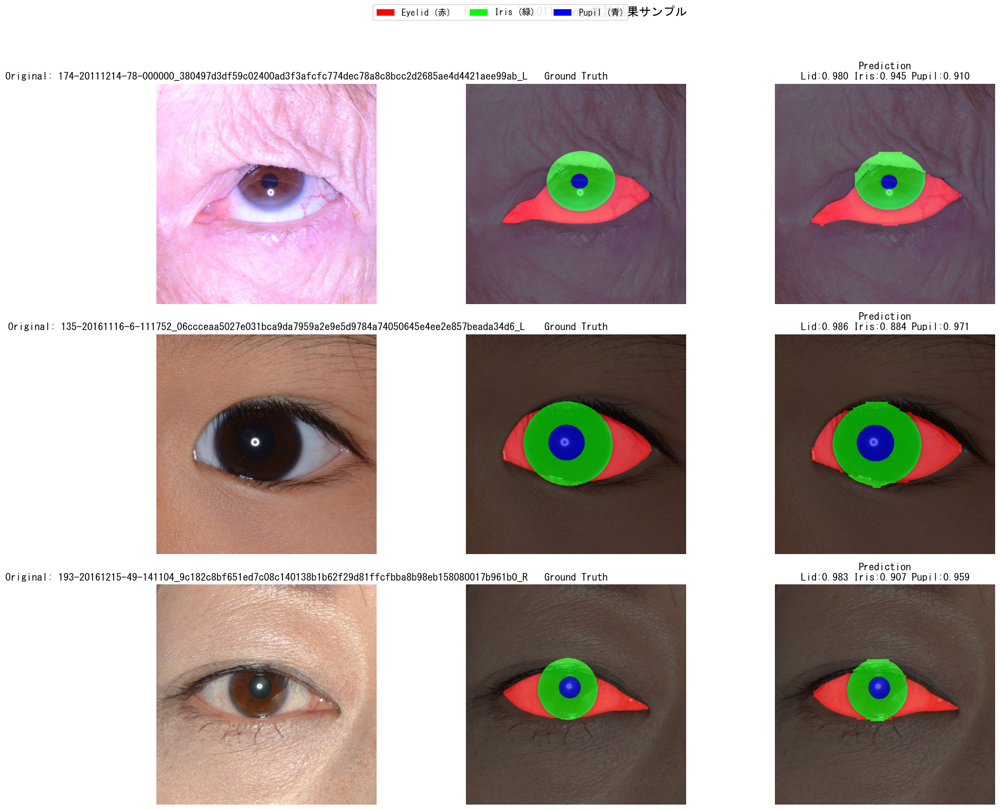


Fold 1 のサンプルを可視化中...


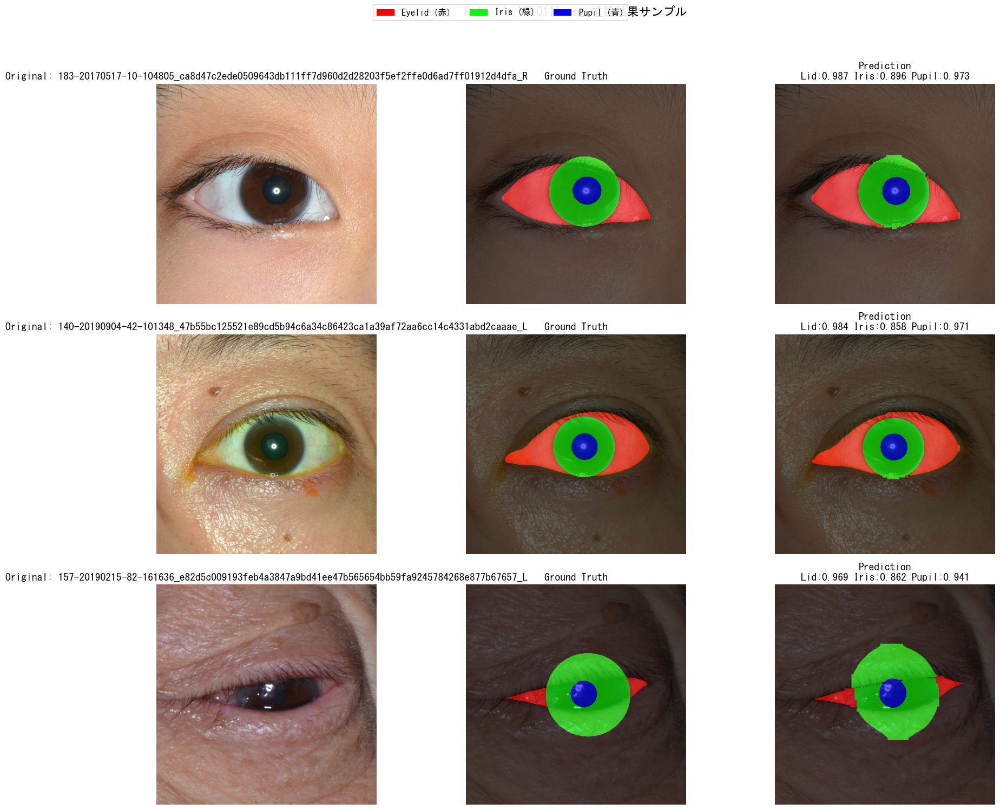


Fold 2 のサンプルを可視化中...


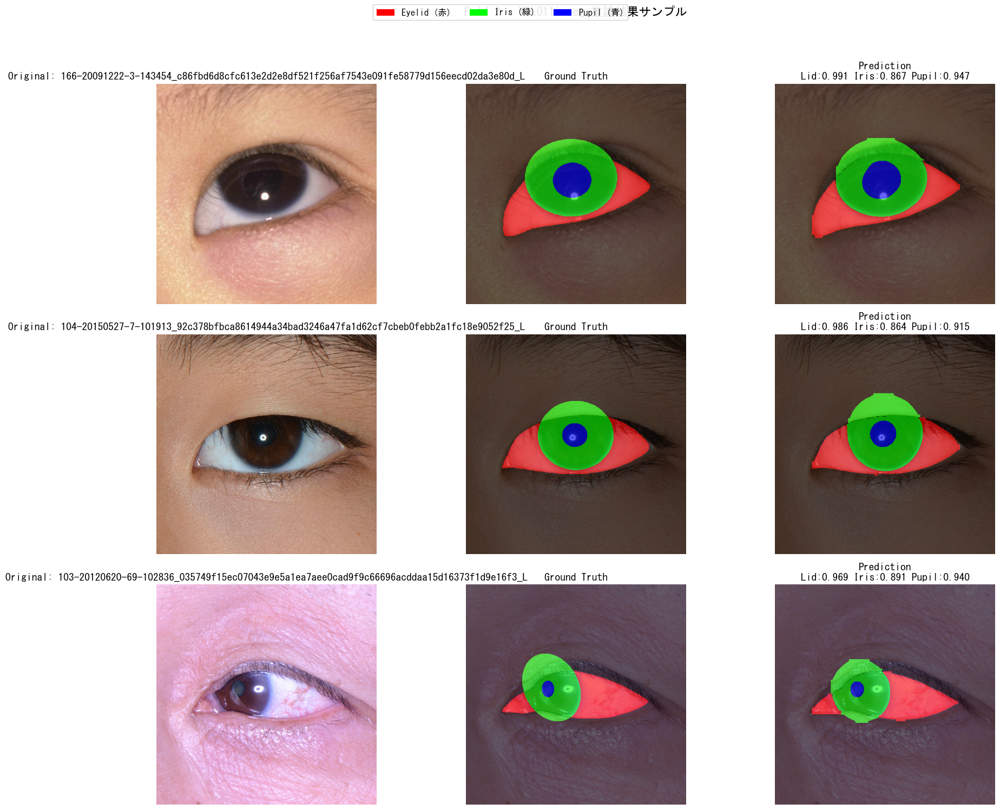


Fold 3 のサンプルを可視化中...


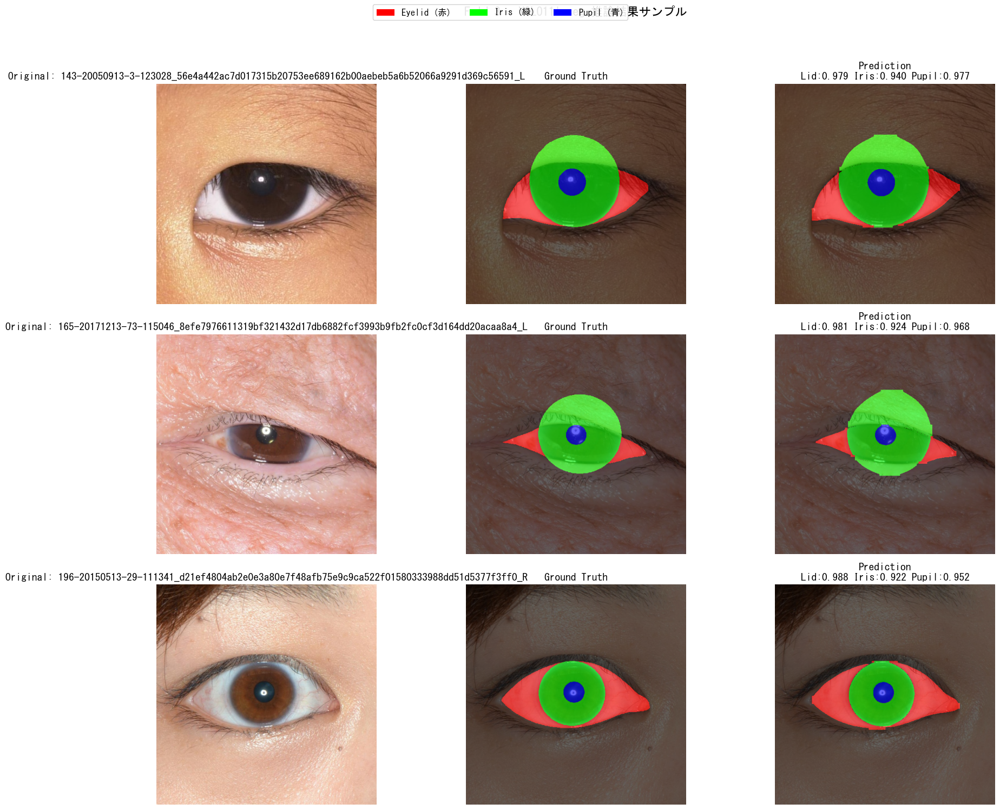


Fold 4 のサンプルを可視化中...


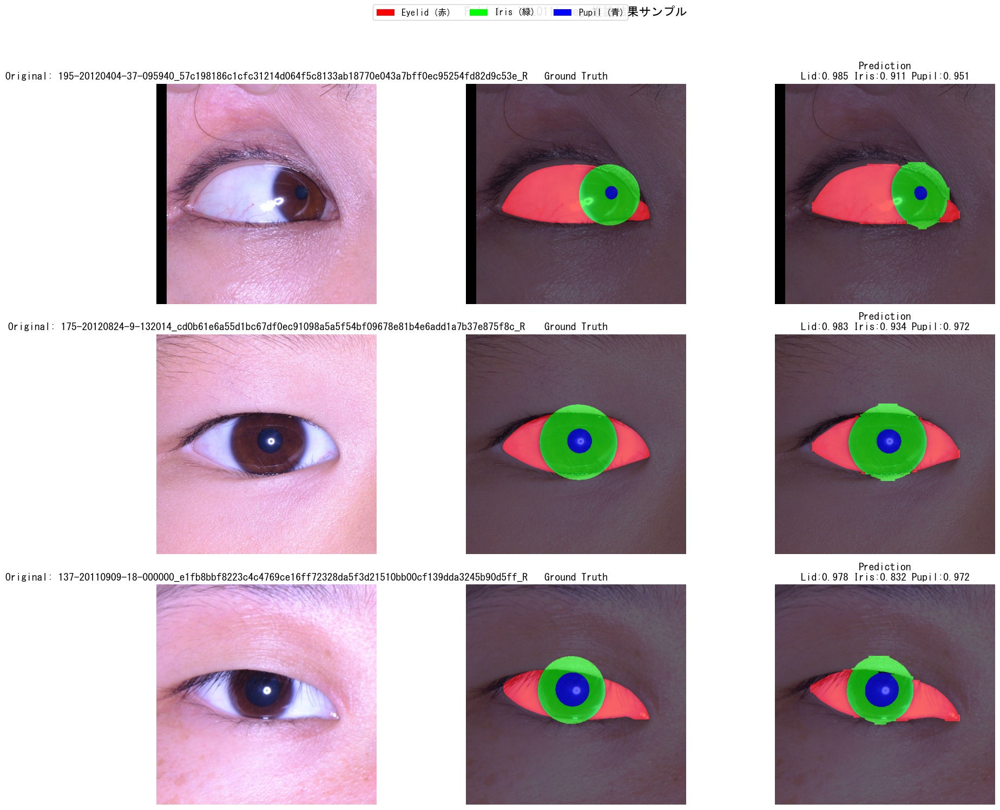


✅ 可視化完了


In [15]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
import random

# 依存変数を復元（セル単体実行でもfold_indices/image_pathsが切れないように）
ensure_ablation_context()

# 日本語フォント設定（Windows用）
try:
    # Windowsで利用可能な日本語フォントを設定
    import platform
    if platform.system() == 'Windows':
        # MS Gothic または Yu Gothic を試す
        for font_name in ['MS Gothic', 'Yu Gothic', 'Meiryo']:
            try:
                matplotlib.rcParams['font.family'] = font_name
                break
            except:
                continue
    else:
        # Linux/Mac用
        matplotlib.rcParams['font.family'] = 'DejaVu Sans'
except:
    pass

# ===== サンプル画像での推論結果可視化 =====
def visualize_yolo_predictions(model, val_ds, num_samples=5, fold_idx=0):
    """
    YOLO推論結果を可視化（Ground TruthとPredictionを並べて表示、クラスごとに色分け）
    
    Args:
        model: YOLOモデル
        val_ds: 評価用データセット
        num_samples: 表示するサンプル数
        fold_idx: Fold番号
    """
    model.eval()
    
    # ランダムにサンプルを選択
    indices = random.sample(range(len(val_ds)), min(num_samples, len(val_ds)))
    
    # 元画像、Ground Truth、Predictionの3列で表示
    fig, axes = plt.subplots(num_samples, 3, figsize=(18, 5*num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    # クラスごとの色定義（明確に区別できる色）
    # Eyelid: 赤、Iris: 緑、Pupil: 青
    colors = {
        'lid': np.array([255, 0, 0], dtype=np.uint8),      # 赤
        'iris': np.array([0, 255, 0], dtype=np.uint8),    # 緑
        'pupil': np.array([0, 0, 255], dtype=np.uint8)     # 青
    }
    
    for row_idx, idx in enumerate(indices):
        sample = val_ds[idx]
        img = sample['image']  # (C, H, W)
        gt_lid = sample['mask_lid'].numpy()  # (H, W)
        gt_iris = sample['mask_iris'].numpy()  # (H, W)
        gt_pupil = sample['mask_pupil'].numpy()  # (H, W)
        filename = sample['filename']
        
        # 画像ファイルから直接読み込んで推論（evaluate_yoloと同じ方法）
        img_path = Path("Images/images") / f"{filename}.jpg"
        
        # 表示用の画像を読み込み（RGB形式）
        img_np = cv2.imread(str(img_path))
        img_np = cv2.cvtColor(img_np, cv2.COLOR_BGR2RGB)
        img_np = cv2.resize(img_np, (512, 512))
        
        # YOLO推論（画像パスから直接）
        results = model.predict(str(img_path), verbose=False, imgsz=512)
        
        # 6クラスセグメンテーションマスクを構築
        h, w = 512, 512
        seg_mask = np.zeros((h, w), dtype=np.uint8)  # クラスIDを格納
        
        if len(results) > 0 and results[0].masks is not None and len(results[0].masks.data) > 0:
            result = results[0]
            masks = result.masks.data.cpu().numpy()  # (N, H, W)
            classes = result.boxes.cls.cpu().numpy().astype(int)  # (N,)
            
            # 評価関数と同じロジック：クラスごとにOR結合してから優先順位で反映
            class_masks = {}
            for mask, cls_id in zip(masks, classes):
                if mask.shape != (h, w):
                    mask_resized = cv2.resize(mask.astype(np.float32), (w, h), interpolation=cv2.INTER_LINEAR)
                else:
                    mask_resized = mask.astype(np.float32)
                mask_binary = (mask_resized > 0.5).astype(np.uint8)
                class_masks[cls_id] = mask_binary if cls_id not in class_masks else np.maximum(class_masks[cls_id], mask_binary)
            for cls_id in sorted(class_masks.keys(), reverse=True):
                seg_mask[class_masks[cls_id] > 0] = cls_id
        
        # Eyelid, Iris, Pupilの予測マスクを抽出
        lid_pred = (((seg_mask == 1) | (seg_mask == 2) | (seg_mask == 4)).astype(np.uint8))
        iris_pred = (((seg_mask == 2) | (seg_mask == 3)).astype(np.uint8))
        pupil_pred = (((seg_mask == 4) | (seg_mask == 5)).astype(np.uint8))
        
        # Dice係数を計算
        lid_dice = dice_binary_np(lid_pred * 255, gt_lid)
        iris_dice = dice_binary_np(iris_pred * 255, gt_iris)
        pupil_dice = dice_binary_np(pupil_pred * 255, gt_pupil)
        
        # Ground TruthをRGBカラーマスクに変換
        # 注意: 重複領域は後から来るクラスで上書きされる（Pupil > Iris > Eyelidの順）
        gt_colored = np.zeros((h, w, 3), dtype=np.uint8)
        gt_colored[gt_lid > 0] = colors['lid']
        gt_colored[gt_iris > 0] = colors['iris']
        gt_colored[gt_pupil > 0] = colors['pupil']
        

        
        # PredictionをRGBカラーマスクに変換
        pred_colored = np.zeros((h, w, 3), dtype=np.uint8)
        pred_colored[lid_pred > 0] = colors['lid']
        pred_colored[iris_pred > 0] = colors['iris']
        pred_colored[pupil_pred > 0] = colors['pupil']
        
        # 列1: 元画像
        axes[row_idx, 0].imshow(img_np)
        axes[row_idx, 0].set_title(f'Original: {filename}', fontsize=14, fontweight='bold')
        axes[row_idx, 0].axis('off')
        
        # 列2: Ground Truth
        axes[row_idx, 1].imshow(img_np)
        axes[row_idx, 1].imshow(gt_colored, alpha=0.6)
        axes[row_idx, 1].set_title('Ground Truth', fontsize=14, fontweight='bold')
        axes[row_idx, 1].axis('off')
        
        # 列3: Prediction
        axes[row_idx, 2].imshow(img_np)
        axes[row_idx, 2].imshow(pred_colored, alpha=0.6)
        axes[row_idx, 2].set_title(f'Prediction\nLid:{lid_dice:.3f} Iris:{iris_dice:.3f} Pupil:{pupil_dice:.3f}', 
                                   fontsize=14, fontweight='bold')
        axes[row_idx, 2].axis('off')
    
    # 凡例を追加
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor=colors['lid']/255.0, label='Eyelid (赤)'),
        Patch(facecolor=colors['iris']/255.0, label='Iris (緑)'),
        Patch(facecolor=colors['pupil']/255.0, label='Pupil (青)')
    ]
    fig.legend(handles=legend_elements, loc='upper center', ncol=3, fontsize=12, framealpha=0.9)
    
    plt.suptitle(f'Fold {fold_idx} - YOLO11l-seg 推論結果サンプル', fontsize=16, y=0.995, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# ===== ラベルファイル確認用関数 =====
def check_label_files(filename_stem):
    """
    特定の画像のラベルファイルを確認して表示
    
    Args:
        filename_stem: 画像ファイル名（拡張子なし）
    """
    import cv2
    
    # ラベルファイルのパス
    lid_path = LABEL_SEG_DIR / f"{filename_stem}_mask_lid.png"
    iris_path = LABEL_OBB_DIR / f"{filename_stem}_mask_iris.png"
    pupil_path = LABEL_OBB_DIR / f"{filename_stem}_mask_pupil.png"
    
    print(f"ラベルファイル確認: {filename_stem}")
    print(f"  Eyelid: {lid_path} (存在: {lid_path.exists()})")
    print(f"  Iris: {iris_path} (存在: {iris_path.exists()})")
    print(f"  Pupil: {pupil_path} (存在: {pupil_path.exists()})")
    
    if lid_path.exists() and iris_path.exists() and pupil_path.exists():
        # ラベルを読み込んで表示
        lid_mask = cv2.imread(str(lid_path), 0)
        iris_mask = cv2.imread(str(iris_path), 0)
        pupil_mask = cv2.imread(str(pupil_path), 0)
        
        print(f"  Eyelidマスク: shape={lid_mask.shape}, 非ゼロピクセル数={np.sum(lid_mask > 0)}")
        print(f"  Irisマスク: shape={iris_mask.shape}, 非ゼロピクセル数={np.sum(iris_mask > 0)}")
        print(f"  Pupilマスク: shape={pupil_mask.shape}, 非ゼロピクセル数={np.sum(pupil_mask > 0)}")
        
        # 可視化
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(lid_mask, cmap='gray')
        axes[0].set_title('Eyelid Mask (Ground Truth)')
        axes[0].axis('off')
        axes[1].imshow(iris_mask, cmap='gray')
        axes[1].set_title('Iris Mask (Ground Truth)')
        axes[1].axis('off')
        axes[2].imshow(pupil_mask, cmap='gray')
        axes[2].set_title('Pupil Mask (Ground Truth)')
        axes[2].axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print("  ⚠️ 一部のラベルファイルが見つかりません")

# 各Foldから数枚のサンプルを可視化
print("=" * 80)
print("サンプル画像での推論結果可視化")
print("=" * 80)

for fold_idx in range(NUM_FOLDS):
    model_path = MODEL_DIR / f"fold{fold_idx}" / "weights" / "best.pt"
    if not model_path.exists():
        print(f"⚠️ Fold {fold_idx}: モデルが見つかりません: {model_path}")
        continue
    
    print(f"\nFold {fold_idx} のサンプルを可視化中...")
    
    # YOLOモデルをロード
    from ultralytics import YOLO
    model = YOLO(str(model_path))
    
    # Validation dataset準備
    val_indices = fold_indices[str(fold_idx)]['val']
    val_paths = [image_paths[i] for i in val_indices]
    val_ds = EyeSegmentationDataset(val_paths, LABEL_SEG_DIR, LABEL_OBB_DIR, transform=False)
    
    # 可視化
    visualize_yolo_predictions(model, val_ds, num_samples=3, fold_idx=fold_idx)

print("\n" + "=" * 80)
print("✅ 可視化完了")
print("=" * 80)


In [12]:
# 例: 問題のある画像のラベルを確認
check_label_files("162-20180808-8-105135_a350adee6a8b91bbc5ca2b14675a44b7bec5960a0826bca688e26dc1f982a6736")

ラベルファイル確認: 162-20180808-8-105135_a350adee6a8b91bbc5ca2b14675a44b7bec5960a0826bca688e26dc1f982a6736
  Eyelid: Images\labels_seg\162-20180808-8-105135_a350adee6a8b91bbc5ca2b14675a44b7bec5960a0826bca688e26dc1f982a6736_mask_lid.png (存在: False)
  Iris: Images\labels_obb\162-20180808-8-105135_a350adee6a8b91bbc5ca2b14675a44b7bec5960a0826bca688e26dc1f982a6736_mask_iris.png (存在: False)
  Pupil: Images\labels_obb\162-20180808-8-105135_a350adee6a8b91bbc5ca2b14675a44b7bec5960a0826bca688e26dc1f982a6736_mask_pupil.png (存在: False)
  ⚠️ 一部のラベルファイルが見つかりません


In [26]:
# ===== 非RANSAC：3手法（fitなし / 露出弧fit / full最大外輪郭fit）を一括評価 =====
# 出力:
# - results/yolo11_eval_raw_*.csv
# - results/yolo11_eval_outerarc_*.csv
# - results/yolo11_eval_fullmax_*.csv
# - results/yolo11_comparison_nonransac_*.csv（平均の表）

from pathlib import Path
from datetime import datetime
import pandas as pd

ensure_ablation_context()

# fold_indices/image_paths が未定義のまま実行されるケースを防ぐ（念のため）
# - ensure_ablation_context が定義済みでも、カーネル再起動直後などで値が未ロードの場合があるため、ここで確実に復元します
if 'fold_indices' not in globals():
    import json
    with open('fold_indices.json', 'r') as f:
        fold_indices = json.load(f)

if 'image_paths' not in globals():
    import pandas as pd
    from pathlib import Path
    if 'IMAGES_DIR' not in globals():
        IMAGES_DIR = Path('Images/images')
    df = pd.read_csv('image_metadata.csv')
    image_paths = [IMAGES_DIR / row['filename'] for _, row in df.iterrows()]

results_dir = Path('results')
results_dir.mkdir(exist_ok=True)

timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

from ultralytics import YOLO
from torch.utils.data import DataLoader

# NOTE: RANSACは重いので別セル（下）で評価します
rows = { 'raw': [], 'outerarc': [], 'fullmax': [] }

print('\n' + '='*80)
print('YOLO11l-seg 非RANSAC（3手法）一括評価 開始')
print('='*80)

for fold_idx in range(NUM_FOLDS):
    print(f"\nFold {fold_idx} 評価中...")

    model_path = MODEL_DIR / f"fold{fold_idx}" / "weights" / "best.pt"
    if not model_path.exists():
        print(f"  ⚠️ モデルが見つかりません: {model_path}")
        continue

    model = YOLO(str(model_path))

    val_indices = fold_indices[str(fold_idx)]['val']
    val_paths = [image_paths[i] for i in val_indices]
    val_ds = EyeSegmentationDataset(val_paths, LABEL_SEG_DIR, LABEL_OBB_DIR, transform=False)
    val_loader = DataLoader(val_ds, batch_size=16, shuffle=False, num_workers=0, pin_memory=False)

    ret = evaluate_yolo_all_modes(model, val_loader, device, modes=['raw','outerarc','fullmax'])
    if not (isinstance(ret, tuple) and len(ret) == 2):
        raise RuntimeError(
            "evaluate_yolo_all_modes の定義が古い可能性があります。\n"
            "→ 先に『評価関数を定義しました（楕円フィッティング対応版）』のセル（Cell 6）を再実行してください。"
        )
    out, per_image = ret

    # 非RANSAC3手法だけを採用（raw / outerarc / fullmax）
    for mode in ['raw', 'outerarc', 'fullmax']:
        metrics = out[mode]
        r = dict(metrics)
        r['fold'] = fold_idx
        rows[mode].append(r)

    # 画像ごとの結果も保存（被験者クラスタ統計用）
    for mode in ['raw','outerarc','fullmax']:
        df_img = pd.DataFrame(per_image[mode])
        df_img['fold'] = fold_idx
        out_img_path = results_dir / f"yolo11_eval_perimage_{mode}_{timestamp}.csv"
        # foldごとに追記（同一timestampの1ファイルに統合）
        header = not out_img_path.exists()
        df_img.to_csv(out_img_path, index=False, mode='a', header=header)

    # 簡易表示（平均）
    print('  ✅ Fold結果（mean Dice）:', {k: f"{out[k]['mean']:.4f}" for k in ['raw','outerarc','fullmax']})

print('\n' + '='*80)
print('✅ 非RANSAC（3手法）一括評価 完了')
print('='*80)

# CSV保存
paths = {}
for mode in ['raw','outerarc','fullmax']:
    df = pd.DataFrame(rows[mode])
    out_path = results_dir / f"yolo11_eval_{mode}_{timestamp}.csv"
    df.to_csv(out_path, index=False)
    paths[mode] = out_path
    print(f"✅ 保存: {out_path}")

# 平均比較表（非RANSAC）
summary = []
for mode in ['raw','outerarc','fullmax']:
    df = pd.DataFrame(rows[mode])
    summary.append({
        'method': mode,
        'eyelid_mean': float(df['eyelid'].mean()),
        'iris_mean': float(df['iris'].mean()),
        'pupil_mean': float(df['pupil'].mean()),
        'overall_mean': float(df['mean'].mean()),
    })

df_sum = pd.DataFrame(summary)
comp_path = results_dir / f"yolo11_comparison_nonransac_{timestamp}.csv"
df_sum.to_csv(comp_path, index=False)
print(f"\n✅ 平均比較表を保存: {comp_path}")
print(df_sum)




YOLO11l-seg 非RANSAC（3手法）一括評価 開始

Fold 0 評価中...


YOLO評価（modes=raw,outerarc,fullmax): 100%|██████████| 25/25 [00:21<00:00,  1.18it/s]


  ✅ Fold結果（mean Dice）: {'raw': '0.9417', 'outerarc': '0.9609', 'fullmax': '0.9654'}

Fold 1 評価中...


YOLO評価（modes=raw,outerarc,fullmax): 100%|██████████| 25/25 [00:28<00:00,  1.13s/it]


  ✅ Fold結果（mean Dice）: {'raw': '0.9360', 'outerarc': '0.9515', 'fullmax': '0.9578'}

Fold 2 評価中...


YOLO評価（modes=raw,outerarc,fullmax): 100%|██████████| 25/25 [00:21<00:00,  1.15it/s]


  ✅ Fold結果（mean Dice）: {'raw': '0.9239', 'outerarc': '0.9476', 'fullmax': '0.9531'}

Fold 3 評価中...


YOLO評価（modes=raw,outerarc,fullmax): 100%|██████████| 25/25 [00:21<00:00,  1.17it/s]


  ✅ Fold結果（mean Dice）: {'raw': '0.9284', 'outerarc': '0.9494', 'fullmax': '0.9546'}

Fold 4 評価中...


YOLO評価（modes=raw,outerarc,fullmax): 100%|██████████| 25/25 [00:20<00:00,  1.19it/s]

  ✅ Fold結果（mean Dice）: {'raw': '0.9332', 'outerarc': '0.9539', 'fullmax': '0.9583'}

✅ 非RANSAC（3手法）一括評価 完了
✅ 保存: results\yolo11_eval_raw_20251231_015727.csv
✅ 保存: results\yolo11_eval_outerarc_20251231_015727.csv
✅ 保存: results\yolo11_eval_fullmax_20251231_015727.csv

✅ 平均比較表を保存: results\yolo11_comparison_nonransac_20251231_015727.csv
     method  eyelid_mean  iris_mean  pupil_mean  overall_mean
0       raw     0.976367   0.892886    0.928735      0.932663
1  outerarc     0.976367   0.951526    0.930109      0.952667
2   fullmax     0.976367   0.964134    0.932980      0.957827


In [27]:
# ===== RANSAC：2手法（露出弧限定RANSAC / whole-mask RANSAC）を一括評価 =====
# 出力:
# - results/yolo11_eval_ransac_whole_*.csv
# - results/yolo11_eval_ransac_arc_*.csv
# - results/yolo11_comparison_ransac_*.csv（平均の表）

from pathlib import Path
from datetime import datetime
import pandas as pd

ensure_ablation_context()

results_dir = Path('results')
results_dir.mkdir(exist_ok=True)

timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

from ultralytics import YOLO
from torch.utils.data import DataLoader

rows = { 'ransac_whole': [], 'ransac_arc': [] }

print('\n' + '='*80)
print('YOLO11l-seg RANSAC評価（2手法）開始')
print('='*80)

for fold_idx in range(NUM_FOLDS):
    print(f"\nFold {fold_idx} 評価中...")

    model_path = MODEL_DIR / f"fold{fold_idx}" / "weights" / "best.pt"
    if not model_path.exists():
        print(f"  ⚠️ モデルが見つかりません: {model_path}")
        continue

    model = YOLO(str(model_path))

    val_indices = fold_indices[str(fold_idx)]['val']
    val_paths = [image_paths[i] for i in val_indices]
    val_ds = EyeSegmentationDataset(val_paths, LABEL_SEG_DIR, LABEL_OBB_DIR, transform=False)
    val_loader = DataLoader(val_ds, batch_size=16, shuffle=False, num_workers=0, pin_memory=False)

    ret = evaluate_yolo_all_modes(model, val_loader, device, modes=['ransac_whole','ransac_arc'])
    if not (isinstance(ret, tuple) and len(ret) == 2):
        raise RuntimeError(
            "evaluate_yolo_all_modes の定義が古い可能性があります。\n"
            "→ 先に『評価関数を定義しました（楕円フィッティング対応版）』のセル（Cell 6）を再実行してください。"
        )
    out, per_image = ret

    for mode in ['ransac_whole','ransac_arc']:
        metrics = out[mode]
        r = dict(metrics)
        r['fold'] = fold_idx
        rows[mode].append(r)

    # 画像ごとの結果も保存（被験者クラスタ統計用）
    for mode in ['ransac_whole','ransac_arc']:
        df_img = pd.DataFrame(per_image[mode])
        df_img['fold'] = fold_idx
        out_img_path = results_dir / f"yolo11_eval_perimage_{mode}_{timestamp}.csv"
        header = not out_img_path.exists()
        df_img.to_csv(out_img_path, index=False, mode='a', header=header)

    print('  ✅ Fold結果（mean Dice）:', {k: f"{out[k]['mean']:.4f}" for k in ['ransac_whole','ransac_arc']})

print('\n' + '='*80)
print('✅ RANSAC評価 完了')
print('='*80)

# CSV保存
for mode in ['ransac_whole','ransac_arc']:
    df = pd.DataFrame(rows[mode])
    out_path = results_dir / f"yolo11_eval_{mode}_{timestamp}.csv"
    df.to_csv(out_path, index=False)
    print(f"✅ 保存: {out_path}")

# 平均比較表（RANSAC）
summary = []
for mode in ['ransac_whole','ransac_arc']:
    df = pd.DataFrame(rows[mode])
    summary.append({
        'method': mode,
        'eyelid_mean': float(df['eyelid'].mean()),
        'iris_mean': float(df['iris'].mean()),
        'pupil_mean': float(df['pupil'].mean()),
        'overall_mean': float(df['mean'].mean()),
    })

df_sum = pd.DataFrame(summary)
comp_path = results_dir / f"yolo11_comparison_ransac_{timestamp}.csv"
df_sum.to_csv(comp_path, index=False)
print(f"\n✅ 平均比較表を保存: {comp_path}")
print(df_sum)




YOLO11l-seg RANSAC評価（2手法）開始

Fold 0 評価中...


YOLO評価（modes=ransac_whole,ransac_arc):  16%|█▌        | 4/25 [16:50<1:27:22, 249.66s/it]c:\Users\CorneAI\Eyelid_Iris_pupil_seg_comparison\venv\Lib\site-packages\skimage\measure\fit.py:530: RuntimeWarning: divide by zero encountered in scalar divide
  phi = 0.5 * np.arctan((2.0 * b) / (a - c))
YOLO評価（modes=ransac_whole,ransac_arc): 100%|██████████| 25/25 [1:36:14<00:00, 230.99s/it]


  ✅ Fold結果（mean Dice）: {'ransac_whole': '0.9643', 'ransac_arc': '0.9593'}

Fold 1 評価中...


YOLO評価（modes=ransac_whole,ransac_arc):  36%|███▌      | 9/25 [33:35<59:36, 223.54s/it]  c:\Users\CorneAI\Eyelid_Iris_pupil_seg_comparison\venv\Lib\site-packages\skimage\measure\fit.py:525: RuntimeWarning: divide by zero encountered in scalar divide
  width = np.sqrt(2 * numerator / denominator1)
c:\Users\CorneAI\Eyelid_Iris_pupil_seg_comparison\venv\Lib\site-packages\skimage\measure\fit.py:525: RuntimeWarning: invalid value encountered in sqrt
  width = np.sqrt(2 * numerator / denominator1)
YOLO評価（modes=ransac_whole,ransac_arc): 100%|██████████| 25/25 [1:28:26<00:00, 212.26s/it]


  ✅ Fold結果（mean Dice）: {'ransac_whole': '0.9571', 'ransac_arc': '0.9475'}

Fold 2 評価中...


YOLO評価（modes=ransac_whole,ransac_arc):  16%|█▌        | 4/25 [13:24<1:10:16, 200.77s/it]c:\Users\CorneAI\Eyelid_Iris_pupil_seg_comparison\venv\Lib\site-packages\skimage\measure\fit.py:530: RuntimeWarning: divide by zero encountered in scalar divide
  phi = 0.5 * np.arctan((2.0 * b) / (a - c))
YOLO評価（modes=ransac_whole,ransac_arc): 100%|██████████| 25/25 [1:39:34<00:00, 239.00s/it]


  ✅ Fold結果（mean Dice）: {'ransac_whole': '0.9520', 'ransac_arc': '0.9445'}

Fold 3 評価中...


YOLO評価（modes=ransac_whole,ransac_arc): 100%|██████████| 25/25 [1:28:50<00:00, 213.23s/it]


  ✅ Fold結果（mean Dice）: {'ransac_whole': '0.9534', 'ransac_arc': '0.9453'}

Fold 4 評価中...


YOLO評価（modes=ransac_whole,ransac_arc):  52%|█████▏    | 13/25 [48:28<45:15, 226.30s/it] c:\Users\CorneAI\Eyelid_Iris_pupil_seg_comparison\venv\Lib\site-packages\skimage\measure\fit.py:530: RuntimeWarning: divide by zero encountered in scalar divide
  phi = 0.5 * np.arctan((2.0 * b) / (a - c))
YOLO評価（modes=ransac_whole,ransac_arc): 100%|██████████| 25/25 [1:37:15<00:00, 233.42s/it]

  ✅ Fold結果（mean Dice）: {'ransac_whole': '0.9571', 'ransac_arc': '0.9523'}

✅ RANSAC評価 完了
✅ 保存: results\yolo11_eval_ransac_whole_20251231_015922.csv
✅ 保存: results\yolo11_eval_ransac_arc_20251231_015922.csv

✅ 平均比較表を保存: results\yolo11_comparison_ransac_20251231_015922.csv
         method  eyelid_mean  iris_mean  pupil_mean  overall_mean
0  ransac_whole     0.976367   0.963492    0.930513       0.95679
1    ransac_arc     0.976367   0.945547    0.927425       0.94978


## 9. 結果集計・保存（crossvalidation.ipynbと同じ形式）


In [29]:
# ===== 結果集計（CSVから読む：非RANSAC / RANSAC） + 被験者クラスタ統計（推奨） =====
# 旧実装の evaluation_results_without_ellipse / evaluation_results_with_ellipse は使用しません。

from pathlib import Path
import pandas as pd
import numpy as np

results_dir = Path('results')

def latest_csv(glob_pat: str):
    files = sorted(results_dir.glob(glob_pat), key=lambda p: p.stat().st_mtime, reverse=True)
    return files[0] if files else None

def print_block(title: str):
    print("\n" + "=" * 80)
    print(title)
    print("=" * 80)

def summarize_fold_df(df: pd.DataFrame, mode: str):
    return {
        'method': mode,
        'eyelid_mean': float(df['eyelid'].mean()),
        'iris_mean': float(df['iris'].mean()),
        'pupil_mean': float(df['pupil'].mean()),
        'overall_mean': float(df['mean'].mean()),
    }

def holm_adjust(pvals: dict):
    """pvals: {name: p}. return {name: p_holm}."""
    items = sorted(pvals.items(), key=lambda kv: kv[1])
    m = len(items)
    out = {}
    prev = 0.0
    for j, (name, p) in enumerate(items, start=1):
        adj = (m - j + 1) * p
        adj = min(1.0, adj)
        adj = max(prev, adj)
        prev = adj
        out[name] = adj
    return out

def paired_cluster_permutation_pvalue(diff: np.ndarray, n_perm=20000, seed=0):
    """diff: shape (n_subjects,), paired差（A-B）。両側検定。"""
    rng = np.random.default_rng(seed)
    obs = float(np.mean(diff))
    signs = rng.choice(np.array([-1.0, 1.0]), size=(n_perm, diff.size), replace=True)
    perm = (signs * diff[None, :]).mean(axis=1)
    p = float((np.abs(perm) >= abs(obs)).mean())
    return obs, p

def paired_cluster_bootstrap_ci(diff: np.ndarray, n_boot=20000, seed=1):
    rng = np.random.default_rng(seed)
    n = diff.size
    idx = rng.integers(0, n, size=(n_boot, n))
    boot = diff[idx].mean(axis=1)
    lo, hi = np.quantile(boot, [0.025, 0.975])
    return float(lo), float(hi)

if not results_dir.exists():
    print(f"⚠️ results/ がありません: {results_dir.resolve()}")
else:
    nonransac_modes = ['raw', 'outerarc', 'fullmax']
    ransac_modes = ['ransac_whole', 'ransac_arc']
    all_modes = nonransac_modes + ransac_modes

    # ------------------------------------------------------------------
    # 1) 従来の fold平均CSV（簡易確認）
    # ------------------------------------------------------------------
    print_block("【fold平均（参考）】")
    rows = []
    for mode in all_modes:
        p = latest_csv(f"yolo11_eval_{mode}_*.csv")
        if p is None:
            print(f"  ⚠️ 見つかりません: yolo11_eval_{mode}_*.csv")
            continue
        df = pd.read_csv(p)
        print(f"\n[{mode}] {p.name}")
        print(f"  CSVパス: {p.resolve()}")
        rows.append(summarize_fold_df(df, mode))
    if rows:
        df_sum = pd.DataFrame(rows)
        print("\n--- 平均（fold平均） ---")
        print(df_sum.to_string(index=False))

    # ------------------------------------------------------------------
    # 2) 推奨：被験者クラスタ統計（per-image CSVが必要）
    # ------------------------------------------------------------------
    print_block("【被験者クラスタ統計（推奨）】")
    perimage_paths = {}
    for mode in all_modes:
        p = latest_csv(f"yolo11_eval_perimage_{mode}_*.csv")
        if p is None:
            print(f"  ⚠️ 見つかりません: yolo11_eval_perimage_{mode}_*.csv")
            continue
        perimage_paths[mode] = p
        print(f"  ✅ {mode}: {p.resolve()}")

    if 'raw' not in perimage_paths:
        print("\n⚠️ per-image CSVが無いので統計ができません。")
        print("  → 非RANSACセル / RANSACセルを『修正後の状態で』再実行すると per-image CSV が出ます。")
    else:
        # 読み込み（mode -> df）
        dfs = {m: pd.read_csv(p) for m, p in perimage_paths.items()}

        # subject単位に集約（同一被験者の複数画像は平均）
        metric_cols = ['mean', 'eyelid', 'iris', 'pupil']
        subj = {}
        for m, df in dfs.items():
            if 'subject_id' not in df.columns:
                df['subject_id'] = df['filename'].astype(str).str.split('-', n=1).str[0]
            subj[m] = df.groupby('subject_id')[metric_cols].mean().reset_index()

        # rawと比較できる手法に絞る
        candidates = [m for m in all_modes if m != 'raw' and m in subj]
        if not candidates:
            print("⚠️ raw以外のper-image CSVがありません。")
        else:
            # まずランキング（被験者平均のmeanで比較）
            means = []
            for m, sdf in subj.items():
                means.append({'method': m, 'subject_mean_dice': float(sdf['mean'].mean()), 'n_subjects': int(sdf.shape[0])})
            df_rank = pd.DataFrame(means).sort_values('subject_mean_dice', ascending=False)
            print("\n--- 被験者平均Dice（mean）のランキング ---")
            print(df_rank.to_string(index=False))

            # raw vs 各手法（主結論：mean）
            pvals = {}
            rows = []
            raw_df = subj['raw'].set_index('subject_id')
            for m in candidates:
                m_df = subj[m].set_index('subject_id')
                common = raw_df.index.intersection(m_df.index)
                if len(common) < 5:
                    print(f"  ⚠️ {m}: 共通被験者が少なすぎます (n={len(common)})")
                    continue
                diff = (m_df.loc[common, 'mean'].to_numpy() - raw_df.loc[common, 'mean'].to_numpy()).astype(float)
                obs, p = paired_cluster_permutation_pvalue(diff, n_perm=20000, seed=0)
                lo, hi = paired_cluster_bootstrap_ci(diff, n_boot=20000, seed=1)
                win = float((diff > 0).mean())
                rows.append({
                    'compare': f"{m} - raw",
                    'n_subjects': int(len(common)),
                    'mean_diff': float(obs),
                    'ci95_low': float(lo),
                    'ci95_high': float(hi),
                    'win_rate': float(win),
                    'p_perm': float(p),
                })
                pvals[m] = p

            if rows:
                # Holm補正（主結論：mean）
                p_holm = holm_adjust(pvals)
                for r in rows:
                    m = r['compare'].split(' - ')[0]
                    r['p_holm'] = float(p_holm.get(m, np.nan))

                df_stat = pd.DataFrame(rows).sort_values('p_perm')
                print("\n--- 主結論（mean Dice）：raw vs 各手法（被験者クラスタ / 置換検定 + Holm） ---")
                print(df_stat.to_string(index=False))

                # ----------------------------------------------------------
                # 追加：目的に直結する直接比較（full vs 露出）
                #   - fullmax vs outerarc
                #   - ransac_whole vs ransac_arc
                # （どちらも mean Dice の被験者平均を比較）
                # ----------------------------------------------------------
                print("\n--- 直接比較（mean Dice）：full vs 露出（被験者クラスタ / 置換検定 + Holm） ---")

                pair_specs = [
                    ('fullmax', 'outerarc'),
                    ('ransac_whole', 'ransac_arc'),
                ]

                pair_rows = []
                pair_pvals = {}
                for a, b in pair_specs:
                    if a not in subj or b not in subj:
                        continue
                    a_df = subj[a].set_index('subject_id')
                    b_df = subj[b].set_index('subject_id')
                    common = a_df.index.intersection(b_df.index)
                    if len(common) < 5:
                        print(f"  ⚠️ {a} vs {b}: 共通被験者が少なすぎます (n={len(common)})")
                        continue
                    diff = (a_df.loc[common, 'mean'].to_numpy() - b_df.loc[common, 'mean'].to_numpy()).astype(float)
                    obs, p = paired_cluster_permutation_pvalue(diff, n_perm=20000, seed=10)
                    lo, hi = paired_cluster_bootstrap_ci(diff, n_boot=20000, seed=11)
                    win = float((diff > 0).mean())
                    pair_rows.append({
                        'compare': f"{a} - {b}",
                        'n_subjects': int(len(common)),
                        'mean_diff': float(obs),
                        'ci95_low': float(lo),
                        'ci95_high': float(hi),
                        'win_rate': float(win),
                        'p_perm': float(p),
                    })
                    pair_pvals[f"{a}-{b}"] = p

                if pair_rows:
                    p_holm_pairs = holm_adjust(pair_pvals)
                    for r in pair_rows:
                        key = r['compare'].replace(' - ', '-')
                        r['p_holm'] = float(p_holm_pairs.get(key, np.nan))
                    df_pair = pd.DataFrame(pair_rows).sort_values('p_perm')
                    print(df_pair.to_string(index=False))
                else:
                    print("  ⚠️ 必要なper-image CSVが不足していて直接比較ができません。")

                # クラス別（探索的：補正なしで参考表示）
                print("\n--- クラス別（探索的・補正なしの参考） ---")
                for cls in ['eyelid','iris','pupil']:
                    cls_rows = []
                    for m in candidates:
                        m_df = subj[m].set_index('subject_id')
                        common = raw_df.index.intersection(m_df.index)
                        if len(common) < 5:
                            continue
                        diff = (m_df.loc[common, cls].to_numpy() - raw_df.loc[common, cls].to_numpy()).astype(float)
                        obs, p = paired_cluster_permutation_pvalue(diff, n_perm=20000, seed=2)
                        lo, hi = paired_cluster_bootstrap_ci(diff, n_boot=20000, seed=3)
                        cls_rows.append({'compare': f"{m}-raw", 'n': int(len(common)), 'diff': float(obs), 'ci_low': float(lo), 'ci_high': float(hi), 'p': float(p)})
                    if cls_rows:
                        dfc = pd.DataFrame(cls_rows).sort_values('p')
                        print(f"\n[{cls}]")
                        print(dfc.to_string(index=False))

    print_block("結果集計完了")


【fold平均（参考）】

[raw] yolo11_eval_raw_20251231_015727.csv
  CSVパス: C:\Users\CorneAI\Eyelid_Iris_pupil_seg_comparison\results\yolo11_eval_raw_20251231_015727.csv

[outerarc] yolo11_eval_outerarc_20251231_015727.csv
  CSVパス: C:\Users\CorneAI\Eyelid_Iris_pupil_seg_comparison\results\yolo11_eval_outerarc_20251231_015727.csv

[fullmax] yolo11_eval_fullmax_20251231_015727.csv
  CSVパス: C:\Users\CorneAI\Eyelid_Iris_pupil_seg_comparison\results\yolo11_eval_fullmax_20251231_015727.csv

[ransac_whole] yolo11_eval_ransac_whole_20251231_015922.csv
  CSVパス: C:\Users\CorneAI\Eyelid_Iris_pupil_seg_comparison\results\yolo11_eval_ransac_whole_20251231_015922.csv

[ransac_arc] yolo11_eval_ransac_arc_20251231_015922.csv
  CSVパス: C:\Users\CorneAI\Eyelid_Iris_pupil_seg_comparison\results\yolo11_eval_ransac_arc_20251231_015922.csv

--- 平均（fold平均） ---
      method  eyelid_mean  iris_mean  pupil_mean  overall_mean
         raw     0.976367   0.892886    0.928735      0.932663
    outerarc     0.976367   0.95152

In [ ]:
# Method3（U-Net）vs SegFormer 比較（セル単独実行でも動くように self-contained）
from pathlib import Path
import pandas as pd
import numpy as np
from datetime import datetime

results_dir = Path("results")
results_dir.mkdir(parents=True, exist_ok=True)

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# ---- Method3（U-Net）側：最新の summary CSV ----
method3_files = sorted(results_dir.glob("cv_eval_summary_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)
if not method3_files:
    print("⚠️ Method3の結果ファイル（results/cv_eval_summary_*.csv）が見つかりません。")
else:
    method3_results = pd.read_csv(method3_files[0])
    if 'Method' not in method3_results.columns or 'Method3' not in set(method3_results['Method'].astype(str)):
        print(f"⚠️ Method3行が見つかりません: {method3_files[0]}")
    else:
        method3_row = method3_results[method3_results['Method'].astype(str) == 'Method3'].iloc[0]

        # ---- SegFormer側：どの手法の結果と比べるか ----
        # raw / outerarc / fullmax / ransac_whole / ransac_arc
        SEGFORMER_COMPARE_MODE = 'fullmax'

        # まず per-image CSV（推奨）から平均±SD（画像単位）を作る。無ければfold平均CSVにfallback。
        per_path = sorted(results_dir.glob(f"segformer_eval_perimage_{SEGFORMER_COMPARE_MODE}_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)
        fold_path = sorted(results_dir.glob(f"segformer_eval_{SEGFORMER_COMPARE_MODE}_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)

        seg_source = None
        if per_path:
            df_seg = pd.read_csv(per_path[0])
            seg_source = per_path[0]
        elif fold_path:
            df_seg = pd.read_csv(fold_path[0])
            seg_source = fold_path[0]
        else:
            df_seg = None

        if df_seg is None:
            print(f"⚠️ SegFormerの結果CSVが見つかりません: mode={SEGFORMER_COMPARE_MODE}")
        else:
            # df_seg は列: eyelid/iris/pupil/mean を想定
            for col in ['eyelid','iris','pupil','mean']:
                if col not in df_seg.columns:
                    raise ValueError(f"SegFormer CSVに列 '{col}' がありません: {seg_source}")

            summary = {
                'Eyelid_mean': float(df_seg['eyelid'].mean()),
                'Eyelid_std': float(df_seg['eyelid'].std(ddof=1)),
                'Iris_mean': float(df_seg['iris'].mean()),
                'Iris_std': float(df_seg['iris'].std(ddof=1)),
                'Pupil_mean': float(df_seg['pupil'].mean()),
                'Pupil_std': float(df_seg['pupil'].std(ddof=1)),
                'Total_mean': float(df_seg['mean'].mean()),
                'Total_std': float(df_seg['mean'].std(ddof=1)),
            }

            print("\nMethod3 vs SegFormer 比較")
            print("=" * 80)
            print(f"SegFormer mode: {SEGFORMER_COMPARE_MODE}")
            print(f"SegFormer CSV : {seg_source.resolve()}")
            print("-" * 80)
            print(f"{'Metric':<15} {'Method3 (U-Net)':<22} {'SegFormer':<22} {'Diff(S-M3)':<12}")
            print("-" * 80)

            metrics = [
                ('Eyelid', 'Eyelid_mean', 'Eyelid_std'),
                ('Iris', 'Iris_mean', 'Iris_std'),
                ('Pupil', 'Pupil_mean', 'Pupil_std'),
                ('Mean', 'Total_mean', 'Total_std'),
            ]

            for name, mean_key, std_key in metrics:
                m3_mean = float(method3_row[mean_key])
                m3_std = float(method3_row[std_key])
                seg_mean = float(summary[mean_key])
                seg_std = float(summary[std_key])
                diff = seg_mean - m3_mean
                print(f"{name:<15} {m3_mean:.4f} ± {m3_std:.4f}      {seg_mean:.4f} ± {seg_std:.4f}      {diff:+.4f}")

            print("=" * 80)

            comparison = {
                'Method': ['Method3 (U-Net)', f"SegFormer ({SEGFORMER_COMPARE_MODE})"],
                'Eyelid_mean': [float(method3_row['Eyelid_mean']), summary['Eyelid_mean']],
                'Eyelid_std': [float(method3_row['Eyelid_std']), summary['Eyelid_std']],
                'Iris_mean': [float(method3_row['Iris_mean']), summary['Iris_mean']],
                'Iris_std': [float(method3_row['Iris_std']), summary['Iris_std']],
                'Pupil_mean': [float(method3_row['Pupil_mean']), summary['Pupil_mean']],
                'Pupil_std': [float(method3_row['Pupil_std']), summary['Pupil_std']],
                'Total_mean': [float(method3_row['Total_mean']), summary['Total_mean']],
                'Total_std': [float(method3_row['Total_std']), summary['Total_std']],
            }
            comparison_df = pd.DataFrame(comparison)
            out_path = results_dir / f"ablation_comparison_{timestamp}.csv"
            comparison_df.to_csv(out_path, index=False)
            print(f"\n✅ 比較結果を保存しました: {out_path.resolve()}")



📊 Method3 vs SegFormer 比較
Metric          Method3 (U-Net)      SegFormer            差分             
--------------------------------------------------------------------------------


NameError: name 'summary' is not defined

In [ ]:
# Method3（U-Net）vs SegFormer 比較（セル単独実行でも動くように self-contained）
from pathlib import Path
import pandas as pd
import numpy as np
from datetime import datetime

results_dir = Path("results")
results_dir.mkdir(parents=True, exist_ok=True)

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# ---- Method3（U-Net）側：最新の summary CSV ----
method3_files = sorted(results_dir.glob("cv_eval_summary_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)
if not method3_files:
    print("⚠️ Method3の結果ファイル（results/cv_eval_summary_*.csv）が見つかりません。")
else:
    method3_results = pd.read_csv(method3_files[0])
    if 'Method' not in method3_results.columns or 'Method3' not in set(method3_results['Method'].astype(str)):
        print(f"⚠️ Method3行が見つかりません: {method3_files[0]}")
    else:
        method3_row = method3_results[method3_results['Method'].astype(str) == 'Method3'].iloc[0]

        # ---- SegFormer側：どの手法の結果と比べるか ----
        # raw / outerarc / fullmax / ransac_whole / ransac_arc
        SEGFORMER_COMPARE_MODE = 'fullmax'

        # まず per-image CSV（推奨）から平均±SD（画像単位）を作る。無ければfold平均CSVにfallback。
        per_path = sorted(results_dir.glob(f"segformer_eval_perimage_{SEGFORMER_COMPARE_MODE}_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)
        fold_path = sorted(results_dir.glob(f"segformer_eval_{SEGFORMER_COMPARE_MODE}_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)

        seg_source = None
        if per_path:
            df_seg = pd.read_csv(per_path[0])
            seg_source = per_path[0]
        elif fold_path:
            df_seg = pd.read_csv(fold_path[0])
            seg_source = fold_path[0]
        else:
            df_seg = None

        if df_seg is None:
            print(f"⚠️ SegFormerの結果CSVが見つかりません: mode={SEGFORMER_COMPARE_MODE}")
        else:
            # df_seg は列: eyelid/iris/pupil/mean を想定
            for col in ['eyelid','iris','pupil','mean']:
                if col not in df_seg.columns:
                    raise ValueError(f"SegFormer CSVに列 '{col}' がありません: {seg_source}")

            summary = {
                'Eyelid_mean': float(df_seg['eyelid'].mean()),
                'Eyelid_std': float(df_seg['eyelid'].std(ddof=1)),
                'Iris_mean': float(df_seg['iris'].mean()),
                'Iris_std': float(df_seg['iris'].std(ddof=1)),
                'Pupil_mean': float(df_seg['pupil'].mean()),
                'Pupil_std': float(df_seg['pupil'].std(ddof=1)),
                'Total_mean': float(df_seg['mean'].mean()),
                'Total_std': float(df_seg['mean'].std(ddof=1)),
            }

            print("\nMethod3 vs SegFormer 比較")
            print("=" * 80)
            print(f"SegFormer mode: {SEGFORMER_COMPARE_MODE}")
            print(f"SegFormer CSV : {seg_source.resolve()}")
            print("-" * 80)
            print(f"{'Metric':<15} {'Method3 (U-Net)':<22} {'SegFormer':<22} {'Diff(S-M3)':<12}")
            print("-" * 80)

            metrics = [
                ('Eyelid', 'Eyelid_mean', 'Eyelid_std'),
                ('Iris', 'Iris_mean', 'Iris_std'),
                ('Pupil', 'Pupil_mean', 'Pupil_std'),
                ('Mean', 'Total_mean', 'Total_std'),
            ]

            for name, mean_key, std_key in metrics:
                m3_mean = float(method3_row[mean_key])
                m3_std = float(method3_row[std_key])
                seg_mean = float(summary[mean_key])
                seg_std = float(summary[std_key])
                diff = seg_mean - m3_mean
                print(f"{name:<15} {m3_mean:.4f} ± {m3_std:.4f}      {seg_mean:.4f} ± {seg_std:.4f}      {diff:+.4f}")

            print("=" * 80)

            comparison = {
                'Method': ['Method3 (U-Net)', f"SegFormer ({SEGFORMER_COMPARE_MODE})"],
                'Eyelid_mean': [float(method3_row['Eyelid_mean']), summary['Eyelid_mean']],
                'Eyelid_std': [float(method3_row['Eyelid_std']), summary['Eyelid_std']],
                'Iris_mean': [float(method3_row['Iris_mean']), summary['Iris_mean']],
                'Iris_std': [float(method3_row['Iris_std']), summary['Iris_std']],
                'Pupil_mean': [float(method3_row['Pupil_mean']), summary['Pupil_mean']],
                'Pupil_std': [float(method3_row['Pupil_std']), summary['Pupil_std']],
                'Total_mean': [float(method3_row['Total_mean']), summary['Total_mean']],
                'Total_std': [float(method3_row['Total_std']), summary['Total_std']],
            }
            comparison_df = pd.DataFrame(comparison)
            out_path = results_dir / f"ablation_comparison_{timestamp}.csv"
            comparison_df.to_csv(out_path, index=False)
            print(f"\n✅ 比較結果を保存しました: {out_path.resolve()}")



📊 Method3 vs SegFormer 比較
Metric          Method3 (U-Net)      SegFormer            差分             
--------------------------------------------------------------------------------


NameError: name 'summary' is not defined

In [ ]:
# Method3（U-Net）vs SegFormer 比較（セル単独実行でも動くように self-contained）
from pathlib import Path
import pandas as pd
import numpy as np
from datetime import datetime

results_dir = Path("results")
results_dir.mkdir(parents=True, exist_ok=True)

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# ---- Method3（U-Net）側：最新の summary CSV ----
method3_files = sorted(results_dir.glob("cv_eval_summary_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)
if not method3_files:
    print("⚠️ Method3の結果ファイル（results/cv_eval_summary_*.csv）が見つかりません。")
else:
    method3_results = pd.read_csv(method3_files[0])
    if 'Method' not in method3_results.columns or 'Method3' not in set(method3_results['Method'].astype(str)):
        print(f"⚠️ Method3行が見つかりません: {method3_files[0]}")
    else:
        method3_row = method3_results[method3_results['Method'].astype(str) == 'Method3'].iloc[0]

        # ---- SegFormer側：どの手法の結果と比べるか ----
        # raw / outerarc / fullmax / ransac_whole / ransac_arc
        SEGFORMER_COMPARE_MODE = 'fullmax'

        # まず per-image CSV（推奨）から平均±SD（画像単位）を作る。無ければfold平均CSVにfallback。
        per_path = sorted(results_dir.glob(f"segformer_eval_perimage_{SEGFORMER_COMPARE_MODE}_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)
        fold_path = sorted(results_dir.glob(f"segformer_eval_{SEGFORMER_COMPARE_MODE}_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)

        seg_source = None
        if per_path:
            df_seg = pd.read_csv(per_path[0])
            seg_source = per_path[0]
        elif fold_path:
            df_seg = pd.read_csv(fold_path[0])
            seg_source = fold_path[0]
        else:
            df_seg = None

        if df_seg is None:
            print(f"⚠️ SegFormerの結果CSVが見つかりません: mode={SEGFORMER_COMPARE_MODE}")
        else:
            # df_seg は列: eyelid/iris/pupil/mean を想定
            for col in ['eyelid','iris','pupil','mean']:
                if col not in df_seg.columns:
                    raise ValueError(f"SegFormer CSVに列 '{col}' がありません: {seg_source}")

            summary = {
                'Eyelid_mean': float(df_seg['eyelid'].mean()),
                'Eyelid_std': float(df_seg['eyelid'].std(ddof=1)),
                'Iris_mean': float(df_seg['iris'].mean()),
                'Iris_std': float(df_seg['iris'].std(ddof=1)),
                'Pupil_mean': float(df_seg['pupil'].mean()),
                'Pupil_std': float(df_seg['pupil'].std(ddof=1)),
                'Total_mean': float(df_seg['mean'].mean()),
                'Total_std': float(df_seg['mean'].std(ddof=1)),
            }

            print("\nMethod3 vs SegFormer 比較")
            print("=" * 80)
            print(f"SegFormer mode: {SEGFORMER_COMPARE_MODE}")
            print(f"SegFormer CSV : {seg_source.resolve()}")
            print("-" * 80)
            print(f"{'Metric':<15} {'Method3 (U-Net)':<22} {'SegFormer':<22} {'Diff(S-M3)':<12}")
            print("-" * 80)

            metrics = [
                ('Eyelid', 'Eyelid_mean', 'Eyelid_std'),
                ('Iris', 'Iris_mean', 'Iris_std'),
                ('Pupil', 'Pupil_mean', 'Pupil_std'),
                ('Mean', 'Total_mean', 'Total_std'),
            ]

            for name, mean_key, std_key in metrics:
                m3_mean = float(method3_row[mean_key])
                m3_std = float(method3_row[std_key])
                seg_mean = float(summary[mean_key])
                seg_std = float(summary[std_key])
                diff = seg_mean - m3_mean
                print(f"{name:<15} {m3_mean:.4f} ± {m3_std:.4f}      {seg_mean:.4f} ± {seg_std:.4f}      {diff:+.4f}")

            print("=" * 80)

            comparison = {
                'Method': ['Method3 (U-Net)', f"SegFormer ({SEGFORMER_COMPARE_MODE})"],
                'Eyelid_mean': [float(method3_row['Eyelid_mean']), summary['Eyelid_mean']],
                'Eyelid_std': [float(method3_row['Eyelid_std']), summary['Eyelid_std']],
                'Iris_mean': [float(method3_row['Iris_mean']), summary['Iris_mean']],
                'Iris_std': [float(method3_row['Iris_std']), summary['Iris_std']],
                'Pupil_mean': [float(method3_row['Pupil_mean']), summary['Pupil_mean']],
                'Pupil_std': [float(method3_row['Pupil_std']), summary['Pupil_std']],
                'Total_mean': [float(method3_row['Total_mean']), summary['Total_mean']],
                'Total_std': [float(method3_row['Total_std']), summary['Total_std']],
            }
            comparison_df = pd.DataFrame(comparison)
            out_path = results_dir / f"ablation_comparison_{timestamp}.csv"
            comparison_df.to_csv(out_path, index=False)
            print(f"\n✅ 比較結果を保存しました: {out_path.resolve()}")



📊 Method3 vs SegFormer 比較
Metric          Method3 (U-Net)      SegFormer            差分             
--------------------------------------------------------------------------------


NameError: name 'summary' is not defined

In [ ]:
# Method3（U-Net）vs SegFormer 比較（セル単独実行でも動くように self-contained）
from pathlib import Path
import pandas as pd
import numpy as np
from datetime import datetime

results_dir = Path("results")
results_dir.mkdir(parents=True, exist_ok=True)

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# ---- Method3（U-Net）側：最新の summary CSV ----
method3_files = sorted(results_dir.glob("cv_eval_summary_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)
if not method3_files:
    print("⚠️ Method3の結果ファイル（results/cv_eval_summary_*.csv）が見つかりません。")
else:
    method3_results = pd.read_csv(method3_files[0])
    if 'Method' not in method3_results.columns or 'Method3' not in set(method3_results['Method'].astype(str)):
        print(f"⚠️ Method3行が見つかりません: {method3_files[0]}")
    else:
        method3_row = method3_results[method3_results['Method'].astype(str) == 'Method3'].iloc[0]

        # ---- SegFormer側：どの手法の結果と比べるか ----
        # raw / outerarc / fullmax / ransac_whole / ransac_arc
        SEGFORMER_COMPARE_MODE = 'fullmax'

        # まず per-image CSV（推奨）から平均±SD（画像単位）を作る。無ければfold平均CSVにfallback。
        per_path = sorted(results_dir.glob(f"segformer_eval_perimage_{SEGFORMER_COMPARE_MODE}_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)
        fold_path = sorted(results_dir.glob(f"segformer_eval_{SEGFORMER_COMPARE_MODE}_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)

        seg_source = None
        if per_path:
            df_seg = pd.read_csv(per_path[0])
            seg_source = per_path[0]
        elif fold_path:
            df_seg = pd.read_csv(fold_path[0])
            seg_source = fold_path[0]
        else:
            df_seg = None

        if df_seg is None:
            print(f"⚠️ SegFormerの結果CSVが見つかりません: mode={SEGFORMER_COMPARE_MODE}")
        else:
            # df_seg は列: eyelid/iris/pupil/mean を想定
            for col in ['eyelid','iris','pupil','mean']:
                if col not in df_seg.columns:
                    raise ValueError(f"SegFormer CSVに列 '{col}' がありません: {seg_source}")

            summary = {
                'Eyelid_mean': float(df_seg['eyelid'].mean()),
                'Eyelid_std': float(df_seg['eyelid'].std(ddof=1)),
                'Iris_mean': float(df_seg['iris'].mean()),
                'Iris_std': float(df_seg['iris'].std(ddof=1)),
                'Pupil_mean': float(df_seg['pupil'].mean()),
                'Pupil_std': float(df_seg['pupil'].std(ddof=1)),
                'Total_mean': float(df_seg['mean'].mean()),
                'Total_std': float(df_seg['mean'].std(ddof=1)),
            }

            print("\nMethod3 vs SegFormer 比較")
            print("=" * 80)
            print(f"SegFormer mode: {SEGFORMER_COMPARE_MODE}")
            print(f"SegFormer CSV : {seg_source.resolve()}")
            print("-" * 80)
            print(f"{'Metric':<15} {'Method3 (U-Net)':<22} {'SegFormer':<22} {'Diff(S-M3)':<12}")
            print("-" * 80)

            metrics = [
                ('Eyelid', 'Eyelid_mean', 'Eyelid_std'),
                ('Iris', 'Iris_mean', 'Iris_std'),
                ('Pupil', 'Pupil_mean', 'Pupil_std'),
                ('Mean', 'Total_mean', 'Total_std'),
            ]

            for name, mean_key, std_key in metrics:
                m3_mean = float(method3_row[mean_key])
                m3_std = float(method3_row[std_key])
                seg_mean = float(summary[mean_key])
                seg_std = float(summary[std_key])
                diff = seg_mean - m3_mean
                print(f"{name:<15} {m3_mean:.4f} ± {m3_std:.4f}      {seg_mean:.4f} ± {seg_std:.4f}      {diff:+.4f}")

            print("=" * 80)

            comparison = {
                'Method': ['Method3 (U-Net)', f"SegFormer ({SEGFORMER_COMPARE_MODE})"],
                'Eyelid_mean': [float(method3_row['Eyelid_mean']), summary['Eyelid_mean']],
                'Eyelid_std': [float(method3_row['Eyelid_std']), summary['Eyelid_std']],
                'Iris_mean': [float(method3_row['Iris_mean']), summary['Iris_mean']],
                'Iris_std': [float(method3_row['Iris_std']), summary['Iris_std']],
                'Pupil_mean': [float(method3_row['Pupil_mean']), summary['Pupil_mean']],
                'Pupil_std': [float(method3_row['Pupil_std']), summary['Pupil_std']],
                'Total_mean': [float(method3_row['Total_mean']), summary['Total_mean']],
                'Total_std': [float(method3_row['Total_std']), summary['Total_std']],
            }
            comparison_df = pd.DataFrame(comparison)
            out_path = results_dir / f"ablation_comparison_{timestamp}.csv"
            comparison_df.to_csv(out_path, index=False)
            print(f"\n✅ 比較結果を保存しました: {out_path.resolve()}")



📊 Method3 vs SegFormer 比較
Metric          Method3 (U-Net)      SegFormer            差分             
--------------------------------------------------------------------------------


NameError: name 'summary' is not defined

In [ ]:
# Method3（U-Net）vs SegFormer 比較（セル単独実行でも動くように self-contained）
from pathlib import Path
import pandas as pd
import numpy as np
from datetime import datetime

results_dir = Path("results")
results_dir.mkdir(parents=True, exist_ok=True)

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# ---- Method3（U-Net）側：最新の summary CSV ----
method3_files = sorted(results_dir.glob("cv_eval_summary_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)
if not method3_files:
    print("⚠️ Method3の結果ファイル（results/cv_eval_summary_*.csv）が見つかりません。")
else:
    method3_results = pd.read_csv(method3_files[0])
    if 'Method' not in method3_results.columns or 'Method3' not in set(method3_results['Method'].astype(str)):
        print(f"⚠️ Method3行が見つかりません: {method3_files[0]}")
    else:
        method3_row = method3_results[method3_results['Method'].astype(str) == 'Method3'].iloc[0]

        # ---- SegFormer側：どの手法の結果と比べるか ----
        # raw / outerarc / fullmax / ransac_whole / ransac_arc
        SEGFORMER_COMPARE_MODE = 'fullmax'

        # まず per-image CSV（推奨）から平均±SD（画像単位）を作る。無ければfold平均CSVにfallback。
        per_path = sorted(results_dir.glob(f"segformer_eval_perimage_{SEGFORMER_COMPARE_MODE}_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)
        fold_path = sorted(results_dir.glob(f"segformer_eval_{SEGFORMER_COMPARE_MODE}_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)

        seg_source = None
        if per_path:
            df_seg = pd.read_csv(per_path[0])
            seg_source = per_path[0]
        elif fold_path:
            df_seg = pd.read_csv(fold_path[0])
            seg_source = fold_path[0]
        else:
            df_seg = None

        if df_seg is None:
            print(f"⚠️ SegFormerの結果CSVが見つかりません: mode={SEGFORMER_COMPARE_MODE}")
        else:
            # df_seg は列: eyelid/iris/pupil/mean を想定
            for col in ['eyelid','iris','pupil','mean']:
                if col not in df_seg.columns:
                    raise ValueError(f"SegFormer CSVに列 '{col}' がありません: {seg_source}")

            summary = {
                'Eyelid_mean': float(df_seg['eyelid'].mean()),
                'Eyelid_std': float(df_seg['eyelid'].std(ddof=1)),
                'Iris_mean': float(df_seg['iris'].mean()),
                'Iris_std': float(df_seg['iris'].std(ddof=1)),
                'Pupil_mean': float(df_seg['pupil'].mean()),
                'Pupil_std': float(df_seg['pupil'].std(ddof=1)),
                'Total_mean': float(df_seg['mean'].mean()),
                'Total_std': float(df_seg['mean'].std(ddof=1)),
            }

            print("\nMethod3 vs SegFormer 比較")
            print("=" * 80)
            print(f"SegFormer mode: {SEGFORMER_COMPARE_MODE}")
            print(f"SegFormer CSV : {seg_source.resolve()}")
            print("-" * 80)
            print(f"{'Metric':<15} {'Method3 (U-Net)':<22} {'SegFormer':<22} {'Diff(S-M3)':<12}")
            print("-" * 80)

            metrics = [
                ('Eyelid', 'Eyelid_mean', 'Eyelid_std'),
                ('Iris', 'Iris_mean', 'Iris_std'),
                ('Pupil', 'Pupil_mean', 'Pupil_std'),
                ('Mean', 'Total_mean', 'Total_std'),
            ]

            for name, mean_key, std_key in metrics:
                m3_mean = float(method3_row[mean_key])
                m3_std = float(method3_row[std_key])
                seg_mean = float(summary[mean_key])
                seg_std = float(summary[std_key])
                diff = seg_mean - m3_mean
                print(f"{name:<15} {m3_mean:.4f} ± {m3_std:.4f}      {seg_mean:.4f} ± {seg_std:.4f}      {diff:+.4f}")

            print("=" * 80)

            comparison = {
                'Method': ['Method3 (U-Net)', f"SegFormer ({SEGFORMER_COMPARE_MODE})"],
                'Eyelid_mean': [float(method3_row['Eyelid_mean']), summary['Eyelid_mean']],
                'Eyelid_std': [float(method3_row['Eyelid_std']), summary['Eyelid_std']],
                'Iris_mean': [float(method3_row['Iris_mean']), summary['Iris_mean']],
                'Iris_std': [float(method3_row['Iris_std']), summary['Iris_std']],
                'Pupil_mean': [float(method3_row['Pupil_mean']), summary['Pupil_mean']],
                'Pupil_std': [float(method3_row['Pupil_std']), summary['Pupil_std']],
                'Total_mean': [float(method3_row['Total_mean']), summary['Total_mean']],
                'Total_std': [float(method3_row['Total_std']), summary['Total_std']],
            }
            comparison_df = pd.DataFrame(comparison)
            out_path = results_dir / f"ablation_comparison_{timestamp}.csv"
            comparison_df.to_csv(out_path, index=False)
            print(f"\n✅ 比較結果を保存しました: {out_path.resolve()}")



📊 Method3 vs SegFormer 比較
Metric          Method3 (U-Net)      SegFormer            差分             
--------------------------------------------------------------------------------


NameError: name 'summary' is not defined

In [ ]:
# Method3（U-Net）vs SegFormer 比較（セル単独実行でも動くように self-contained）
from pathlib import Path
import pandas as pd
import numpy as np
from datetime import datetime

results_dir = Path("results")
results_dir.mkdir(parents=True, exist_ok=True)

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# ---- Method3（U-Net）側：最新の summary CSV ----
method3_files = sorted(results_dir.glob("cv_eval_summary_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)
if not method3_files:
    print("⚠️ Method3の結果ファイル（results/cv_eval_summary_*.csv）が見つかりません。")
else:
    method3_results = pd.read_csv(method3_files[0])
    if 'Method' not in method3_results.columns or 'Method3' not in set(method3_results['Method'].astype(str)):
        print(f"⚠️ Method3行が見つかりません: {method3_files[0]}")
    else:
        method3_row = method3_results[method3_results['Method'].astype(str) == 'Method3'].iloc[0]

        # ---- SegFormer側：どの手法の結果と比べるか ----
        # raw / outerarc / fullmax / ransac_whole / ransac_arc
        SEGFORMER_COMPARE_MODE = 'fullmax'

        # まず per-image CSV（推奨）から平均±SD（画像単位）を作る。無ければfold平均CSVにfallback。
        per_path = sorted(results_dir.glob(f"segformer_eval_perimage_{SEGFORMER_COMPARE_MODE}_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)
        fold_path = sorted(results_dir.glob(f"segformer_eval_{SEGFORMER_COMPARE_MODE}_*.csv"), key=lambda p: p.stat().st_mtime, reverse=True)

        seg_source = None
        if per_path:
            df_seg = pd.read_csv(per_path[0])
            seg_source = per_path[0]
        elif fold_path:
            df_seg = pd.read_csv(fold_path[0])
            seg_source = fold_path[0]
        else:
            df_seg = None

        if df_seg is None:
            print(f"⚠️ SegFormerの結果CSVが見つかりません: mode={SEGFORMER_COMPARE_MODE}")
        else:
            # df_seg は列: eyelid/iris/pupil/mean を想定
            for col in ['eyelid','iris','pupil','mean']:
                if col not in df_seg.columns:
                    raise ValueError(f"SegFormer CSVに列 '{col}' がありません: {seg_source}")

            summary = {
                'Eyelid_mean': float(df_seg['eyelid'].mean()),
                'Eyelid_std': float(df_seg['eyelid'].std(ddof=1)),
                'Iris_mean': float(df_seg['iris'].mean()),
                'Iris_std': float(df_seg['iris'].std(ddof=1)),
                'Pupil_mean': float(df_seg['pupil'].mean()),
                'Pupil_std': float(df_seg['pupil'].std(ddof=1)),
                'Total_mean': float(df_seg['mean'].mean()),
                'Total_std': float(df_seg['mean'].std(ddof=1)),
            }

            print("\nMethod3 vs SegFormer 比較")
            print("=" * 80)
            print(f"SegFormer mode: {SEGFORMER_COMPARE_MODE}")
            print(f"SegFormer CSV : {seg_source.resolve()}")
            print("-" * 80)
            print(f"{'Metric':<15} {'Method3 (U-Net)':<22} {'SegFormer':<22} {'Diff(S-M3)':<12}")
            print("-" * 80)

            metrics = [
                ('Eyelid', 'Eyelid_mean', 'Eyelid_std'),
                ('Iris', 'Iris_mean', 'Iris_std'),
                ('Pupil', 'Pupil_mean', 'Pupil_std'),
                ('Mean', 'Total_mean', 'Total_std'),
            ]

            for name, mean_key, std_key in metrics:
                m3_mean = float(method3_row[mean_key])
                m3_std = float(method3_row[std_key])
                seg_mean = float(summary[mean_key])
                seg_std = float(summary[std_key])
                diff = seg_mean - m3_mean
                print(f"{name:<15} {m3_mean:.4f} ± {m3_std:.4f}      {seg_mean:.4f} ± {seg_std:.4f}      {diff:+.4f}")

            print("=" * 80)

            comparison = {
                'Method': ['Method3 (U-Net)', f"SegFormer ({SEGFORMER_COMPARE_MODE})"],
                'Eyelid_mean': [float(method3_row['Eyelid_mean']), summary['Eyelid_mean']],
                'Eyelid_std': [float(method3_row['Eyelid_std']), summary['Eyelid_std']],
                'Iris_mean': [float(method3_row['Iris_mean']), summary['Iris_mean']],
                'Iris_std': [float(method3_row['Iris_std']), summary['Iris_std']],
                'Pupil_mean': [float(method3_row['Pupil_mean']), summary['Pupil_mean']],
                'Pupil_std': [float(method3_row['Pupil_std']), summary['Pupil_std']],
                'Total_mean': [float(method3_row['Total_mean']), summary['Total_mean']],
                'Total_std': [float(method3_row['Total_std']), summary['Total_std']],
            }
            comparison_df = pd.DataFrame(comparison)
            out_path = results_dir / f"ablation_comparison_{timestamp}.csv"
            comparison_df.to_csv(out_path, index=False)
            print(f"\n✅ 比較結果を保存しました: {out_path.resolve()}")



📊 Method3 vs SegFormer 比較
Metric          Method3 (U-Net)      SegFormer            差分             
--------------------------------------------------------------------------------


NameError: name 'summary' is not defined